In [16]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
import rasterio
from rasterio.features import rasterize
from rasterio.warp import calculate_default_transform, reproject, Resampling

import geopandas as gpd
from pyproj import Transformer

from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow.keras import Model, Sequential
from tensorflow.keras.layers import (
    Conv2D, MaxPooling2D, Dropout, Flatten, Dense,
    UpSampling2D, Input, Concatenate
)
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

# ============================================================
# 🔧 CONFIGURATION - MODIFIEZ UNIQUEMENT CETTE SECTION
# ============================================================
SR_IMAGE_PATH = "sr.tif"                # Chemin vers votre image GeoTIFF (super-résolu ou autre)
OUTPUT_DIR = "outputs"                  # Dossier de sortie pour les résultats
PATCH_SIZE = 256                        # Taille des patches pour U-Net (256 recommandé)
RANDOM_SEED = 42                        # Seed pour reproductibilité

# Options avancées
BUFFER_DEG = 0.005                      # Buffer en degrés (~500m) pour télécharger les bâtiments
MIN_BUILDING_RATIO = 0.01               # Ratio minimum de bâtiments par patch pour l'entraînement
NUM_PATCHES = 600                       # Nombre de patches à générer pour l'entraînement
# ============================================================

os.makedirs(OUTPUT_DIR, exist_ok=True)
np.random.seed(RANDOM_SEED)
tf.random.set_seed(RANDOM_SEED)

print("✅ Configuration chargée")
print(f"   Image d'entrée: {SR_IMAGE_PATH}")
print(f"   Dossier de sortie: {OUTPUT_DIR}")

✅ Configuration chargée
   Image d'entrée: sr.tif
   Dossier de sortie: outputs


📍 INFORMATIONS SUR L'IMAGE CHARGÉE
   Fichier: sr.tif
   Dimensions: 512 x 512 pixels, 3 bandes
   CRS: EPSG:32734
   Bounds (proj): BoundingBox(left=301418.5322976671, bottom=6239058.947444493, right=302698.5322976671, top=6240338.947444493)
   Zone (Lat/Lon): -33.97027 <-> -33.95897, 18.85058 <-> 18.86471
   Centre: Lat -33.96462, Lon 18.85764


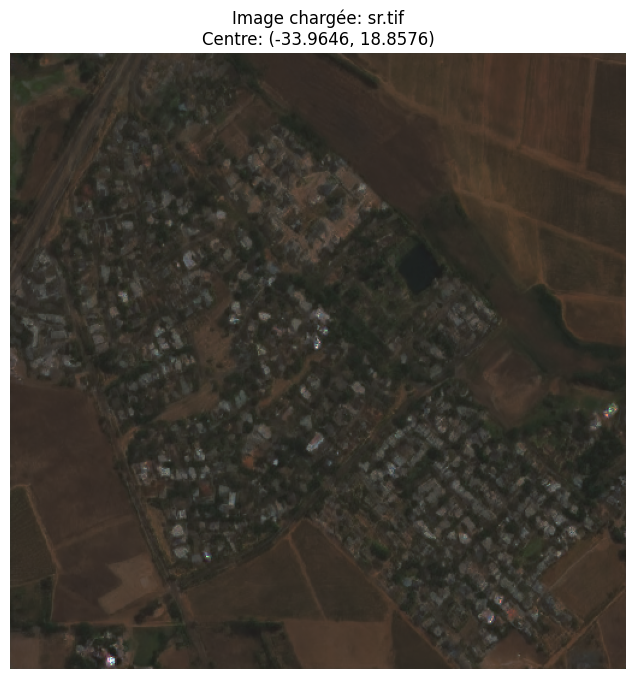

In [17]:
# --- CHARGEMENT DE L'IMAGE GEOTIFF ---

def load_geotiff_image(path):
    """
    Charge une image GeoTIFF et retourne l'image RGB normalisée + métadonnées.
    Fonctionne avec n'importe quelle image GeoTIFF géoréférencée.
    """
    with rasterio.open(path) as src:
        img = src.read()  # (bands, H, W)
        profile = src.profile
        crs = src.crs
        transform = src.transform
        bounds = src.bounds
    
    img = np.transpose(img, (1, 2, 0)).astype(np.float32)  # (H, W, C)
    
    # Normalisation automatique selon le type de données
    if img.max() > 1:
        if img.max() > 255:
            # Probablement uint16 * 10000 (Sentinel-2)
            img = img / 10000.0
        else:
            # uint8 classique
            img = img / 255.0
    
    img = np.clip(img, 0, 1)
    
    # Garder les 3 premières bandes (RGB)
    if img.shape[2] >= 3:
        img_rgb = img[..., :3]
    else:
        # Image en niveaux de gris -> convertir en RGB
        img_rgb = np.stack([img[..., 0]] * 3, axis=-1)
    
    return img_rgb, profile, crs, transform, bounds

# Charger l'image
s2_img, s2_profile, s2_crs, s2_transform, s2_bounds = load_geotiff_image(SR_IMAGE_PATH)

# Calculer les coordonnées géographiques (Lat/Lon)
to_wgs84 = Transformer.from_crs(s2_crs, "EPSG:4326", always_xy=True)
lon_min, lat_min = to_wgs84.transform(s2_bounds.left, s2_bounds.bottom)
lon_max, lat_max = to_wgs84.transform(s2_bounds.right, s2_bounds.top)

# Déterminer la localisation approximative
center_lat = (lat_min + lat_max) / 2
center_lon = (lon_min + lon_max) / 2

print("=" * 60)
print("📍 INFORMATIONS SUR L'IMAGE CHARGÉE")
print("=" * 60)
print(f"   Fichier: {SR_IMAGE_PATH}")
print(f"   Dimensions: {s2_img.shape[0]} x {s2_img.shape[1]} pixels, {s2_img.shape[2]} bandes")
print(f"   CRS: {s2_crs}")
print(f"   Bounds (proj): {s2_bounds}")
print(f"   Zone (Lat/Lon): {lat_min:.5f} <-> {lat_max:.5f}, {lon_min:.5f} <-> {lon_max:.5f}")
print(f"   Centre: Lat {center_lat:.5f}, Lon {center_lon:.5f}")
print("=" * 60)

plt.figure(figsize=(8, 8))
plt.imshow(s2_img)
plt.title(f"Image chargée: {os.path.basename(SR_IMAGE_PATH)}\nCentre: ({center_lat:.4f}, {center_lon:.4f})")
plt.axis("off")
plt.show()

In [18]:
# --- TÉLÉCHARGEMENT AUTOMATIQUE DES BÂTIMENTS ---
# Fonctionne pour n'importe quelle localisation dans le monde
# Utilise Overture Maps (Google Open Buildings + Microsoft + OSM)

def download_buildings_for_image(bounds, crs, buffer_deg=0.005):
    """
    Télécharge automatiquement les bâtiments pour la zone de l'image.
    Fonctionne partout dans le monde grâce à Overture Maps.
    
    Args:
        bounds: rasterio.coords.BoundingBox de l'image
        crs: CRS de l'image
        buffer_deg: buffer en degrés autour de l'image
    
    Returns:
        GeoDataFrame des bâtiments dans le CRS de l'image
    """
    # Convertir les bounds en Lat/Lon
    to_wgs84 = Transformer.from_crs(crs, "EPSG:4326", always_xy=True)
    lon_min, lat_min = to_wgs84.transform(bounds.left, bounds.bottom)
    lon_max, lat_max = to_wgs84.transform(bounds.right, bounds.top)
    
    north, south = max(lat_min, lat_max), min(lat_min, lat_max)
    east, west = max(lon_min, lon_max), min(lon_min, lon_max)
    
    print(f"🌍 Zone de recherche: Lat [{south:.5f}, {north:.5f}], Lon [{west:.5f}, {east:.5f}]")
    
    footprints = None
    
    # 1. Essayer Overture Maps (meilleure couverture mondiale)
    try:
        import overturemaps
        
        bbox = (west - buffer_deg, south - buffer_deg, east + buffer_deg, north + buffer_deg)
        print(f"🏢 Téléchargement Overture Maps (Google + Microsoft + OSM)...")
        
        reader = overturemaps.record_batch_reader("building", bbox=bbox)
        table = reader.read_all()
        gdf = gpd.GeoDataFrame.from_arrow(table)
        
        if gdf.crs is None:
            gdf = gdf.set_crs("EPSG:4326")
        
        gdf = gdf.to_crs(crs)
        gdf = gdf[gdf.geometry.is_valid]
        gdf = gdf[gdf.geometry.geom_type.isin(['Polygon', 'MultiPolygon'])]
        
        # Clipper aux bounds de l'image
        from shapely.geometry import box as shapely_box
        bounds_tuple = (bounds.left, bounds.bottom, bounds.right, bounds.top)
        img_polygon = shapely_box(*bounds_tuple)
        gdf = gdf[gdf.geometry.intersects(img_polygon)]
        
        if len(gdf) > 0:
            print(f"✅ {len(gdf)} bâtiments téléchargés via Overture Maps!")
            footprints = gdf
        else:
            print("⚠️ Aucun bâtiment trouvé via Overture Maps")
            
    except Exception as e:
        print(f"⚠️ Erreur Overture Maps: {e}")
    
    # 2. Fallback sur OSM
    if footprints is None or len(footprints) == 0:
        print("🔄 Tentative avec OpenStreetMap...")
        try:
            import osmnx as ox
            from shapely.geometry import box
            
            margin = buffer_deg
            bbox_polygon = box(west - margin, south - margin, east + margin, north + margin)
            
            tags = {"building": True}
            footprints = ox.features_from_polygon(bbox_polygon, tags=tags)
            footprints = footprints.to_crs(crs)
            footprints = footprints[footprints.geometry.type.isin(['Polygon', 'MultiPolygon'])]
            
            print(f"✅ {len(footprints)} bâtiments récupérés via OSM.")
            
        except Exception as e2:
            print(f"❌ Erreur OSM: {e2}")
            footprints = gpd.GeoDataFrame(columns=['geometry'], crs=crs)
    
    return footprints

# Télécharger les bâtiments pour l'image chargée
footprints = download_buildings_for_image(s2_bounds, s2_crs, buffer_deg=BUFFER_DEG)

# Résumé
print("\n" + "=" * 60)
print("📊 RÉSUMÉ DU TÉLÉCHARGEMENT")
print("=" * 60)
print(f"   Nombre de bâtiments: {len(footprints)}")
if len(footprints) > 0:
    print(f"   Surface totale: {footprints.geometry.area.sum():.0f} m²")
    print(f"   Bounds: {footprints.total_bounds}")
else:
    print("   ⚠️ Aucun bâtiment trouvé dans cette zone!")
print("=" * 60)

footprints.head()

🌍 Zone de recherche: Lat [-33.97027, -33.95897], Lon [18.85058, 18.86471]
🏢 Téléchargement Overture Maps (Google + Microsoft + OSM)...
✅ 1095 bâtiments téléchargés via Overture Maps!

📊 RÉSUMÉ DU TÉLÉCHARGEMENT
   Nombre de bâtiments: 1095
   Surface totale: 202343 m²
   Bounds: [ 301344.49866909 6239033.05653294  302716.8736708  6240371.67111262]


,id,geometry,bbox,version,sources,level,subtype,class,height,names,...,min_height,min_floor,facade_color,facade_material,roof_material,roof_shape,roof_direction,roof_orientation,roof_color,roof_height
25,983e7117-a3ac-4a68-b16d-e930176d4a30,"POLYGON ((301571.653 6239110.181, 301576.159 6...","{'xmin': 18.85224151611328, 'xmax': 18.8524265...",3,"[{'property': '', 'dataset': 'Microsoft ML Bui...",NaN,None,None,NaN,None,...,NaN,NaN,None,None,None,None,NaN,None,None,NaN
26,22baf0f8-9b1c-44a5-891f-0012e079141f,"POLYGON ((301609.009 6239095.241, 301601.09 62...","{'xmin': 18.85234832763672, 'xmax': 18.8526458...",1,"[{'property': '', 'dataset': 'OpenStreetMap', ...",NaN,None,None,NaN,None,...,NaN,NaN,None,None,None,None,NaN,None,None,NaN
95,7f2a7f6b-023a-40ed-8fdc-5f9e22ed5507,"POLYGON ((301697.229 6239033.057, 301713.424 6...","{'xmin': 18.853490829467773, 'xmax': 18.853767...",3,"[{'property': '', 'dataset': 'Microsoft ML Bui...",NaN,None,None,NaN,None,...,NaN,NaN,None,None,None,None,NaN,None,None,NaN
96,e1a9f969-a824-4841-a078-16c2b64046f4,"POLYGON ((301652.751 6239083.486, 301657.211 6...","{'xmin': 18.853113174438477, 'xmax': 18.853277...",1,"[{'property': '', 'dataset': 'Google Open Buil...",NaN,None,None,NaN,None,...,NaN,NaN,None,None,None,None,NaN,None,None,NaN
97,5fd46e99-c2cf-48b4-9bb1-556c6fd1a1f9,"POLYGON ((301615.531 6239089.752, 301621.436 6...","{'xmin': 18.852712631225586, 'xmax': 18.852848...",1,"[{'property': '', 'dataset': 'OpenStreetMap', ...",NaN,commercial,hotel,NaN,{'primary': 'Sunset Farm Stellenbosch Receptio...,...,NaN,NaN,None,None,None,None,NaN,None,None,NaN


📊 Masque généré: 512x512 pixels
   Pixels bâtiments: 46,657 / 262,144
   Couverture: 17.80%


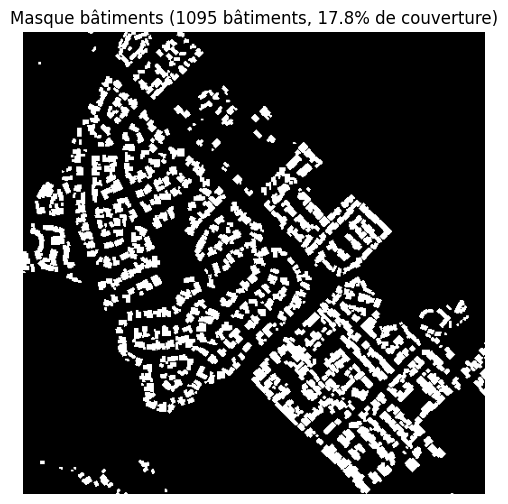

In [19]:
# --- RASTERISATION DU MASQUE DE BÂTIMENTS ---

def rasterize_footprints(footprints, transform, out_shape):
    """
    Convertit les polygones de bâtiments en masque raster binaire.
    """
    if len(footprints) == 0:
        print("⚠️ Aucun bâtiment à rasteriser!")
        return np.zeros(out_shape, dtype=np.uint8)
    
    mask = rasterize(
        [(geom, 1) for geom in footprints.geometry],
        out_shape=out_shape,
        transform=transform,
        fill=0,
        all_touched=True,
        dtype="uint8"
    )
    return mask

H, W, _ = s2_img.shape
building_mask = rasterize_footprints(footprints, s2_transform, (H, W))

# Statistiques du masque
coverage = 100 * building_mask.sum() / building_mask.size
print(f"📊 Masque généré: {H}x{W} pixels")
print(f"   Pixels bâtiments: {building_mask.sum():,} / {building_mask.size:,}")
print(f"   Couverture: {coverage:.2f}%")

plt.figure(figsize=(6, 6))
plt.imshow(building_mask, cmap="gray")
plt.title(f"Masque bâtiments ({len(footprints)} bâtiments, {coverage:.1f}% de couverture)")
plt.axis("off")
plt.show()

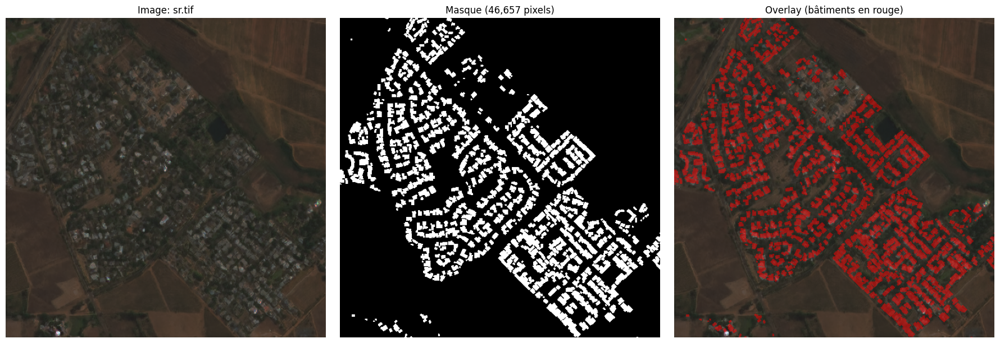

✅ Vérifiez que les contours rouges correspondent aux bâtiments visibles dans l'image.


In [20]:
# --- VÉRIFICATION DE L'ALIGNEMENT MASK / IMAGE ---

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# 1. Image originale
axes[0].imshow(np.clip(s2_img, 0, 1))
axes[0].set_title(f"Image: {os.path.basename(SR_IMAGE_PATH)}")
axes[0].axis("off")

# 2. Masque seul
axes[1].imshow(building_mask, cmap="gray")
axes[1].set_title(f"Masque ({building_mask.sum():,} pixels)")
axes[1].axis("off")

# 3. Overlay
axes[2].imshow(np.clip(s2_img, 0, 1))
mask_overlay = np.zeros((*building_mask.shape, 4))
mask_overlay[..., 0] = 1.0  # Rouge
mask_overlay[..., 3] = (building_mask > 0) * 0.5
axes[2].imshow(mask_overlay)
axes[2].set_title("Overlay (bâtiments en rouge)")
axes[2].axis("off")

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "01_data_overview.png"), dpi=150, bbox_inches='tight')
plt.show()

print("✅ Vérifiez que les contours rouges correspondent aux bâtiments visibles dans l'image.")

📊 COMPARAISON : FOOTPRINTS vs MASQUE RASTERISÉ

🏢 Nombre de bâtiments (footprints vectoriels): 1095
🖼️  Nombre de composantes connexes (masque):     392

📈 Différence: 703 (64.2%)

⚠️ Moins de composantes que de footprints:
   → Des bâtiments proches ont été fusionnés lors de la rasterisation
   → Résolution du raster insuffisante pour séparer les bâtiments adjacents

📏 Taille des composantes (en pixels):
   Min: 2 px
   Max: 1135 px
   Moyenne: 119.0 px
   Médiane: 79.0 px


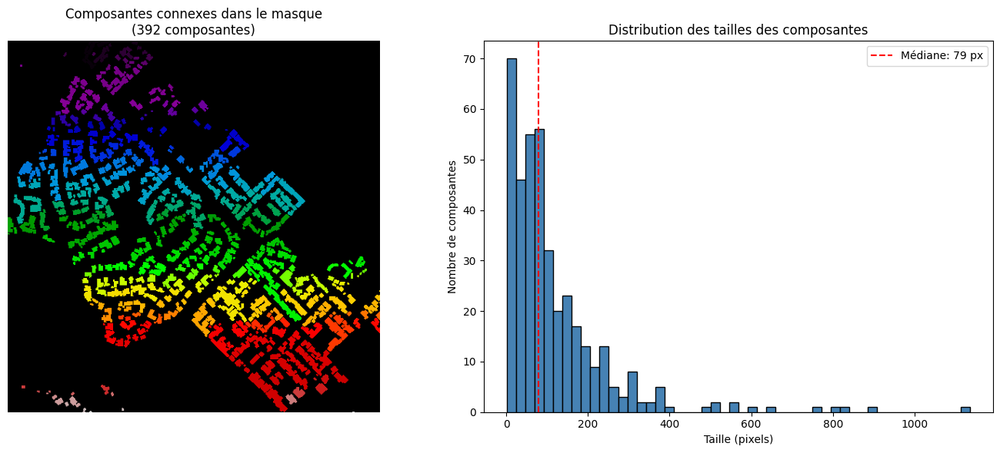

In [21]:
# --- COMPARAISON : Nombre de bâtiments (footprints) vs composantes connexes dans le masque ---
from scipy import ndimage

# 1. Nombre de bâtiments dans les footprints (polygones vectoriels)
num_footprints = len(footprints)

# 2. Nombre de composantes connexes dans le masque rasterisé
labeled_mask, num_components = ndimage.label(building_mask)

# 3. Analyse détaillée
print("=" * 60)
print("📊 COMPARAISON : FOOTPRINTS vs MASQUE RASTERISÉ")
print("=" * 60)
print(f"\n🏢 Nombre de bâtiments (footprints vectoriels): {num_footprints}")
print(f"🖼️  Nombre de composantes connexes (masque):     {num_components}")
print(f"\n📈 Différence: {num_footprints - num_components} ({abs(num_footprints - num_components)/num_footprints*100:.1f}%)")

# Explications des différences possibles
if num_components < num_footprints:
    print("\n⚠️ Moins de composantes que de footprints:")
    print("   → Des bâtiments proches ont été fusionnés lors de la rasterisation")
    print("   → Résolution du raster insuffisante pour séparer les bâtiments adjacents")
elif num_components > num_footprints:
    print("\n⚠️ Plus de composantes que de footprints:")
    print("   → Certains bâtiments MultiPolygon ont été séparés")
    print("   → Artefacts de rasterisation")

# 4. Statistiques sur les tailles des composantes
component_sizes = ndimage.sum(building_mask, labeled_mask, range(1, num_components + 1))
print(f"\n📏 Taille des composantes (en pixels):")
print(f"   Min: {int(min(component_sizes))} px")
print(f"   Max: {int(max(component_sizes))} px")
print(f"   Moyenne: {np.mean(component_sizes):.1f} px")
print(f"   Médiane: {np.median(component_sizes):.1f} px")

# 5. Visualisation
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Masque avec labels colorés
axes[0].imshow(labeled_mask, cmap='nipy_spectral')
axes[0].set_title(f"Composantes connexes dans le masque\n({num_components} composantes)")
axes[0].axis("off")

# Histogramme des tailles
axes[1].hist(component_sizes, bins=50, color='steelblue', edgecolor='black')
axes[1].set_xlabel('Taille (pixels)')
axes[1].set_ylabel('Nombre de composantes')
axes[1].set_title('Distribution des tailles des composantes')
axes[1].axvline(np.median(component_sizes), color='red', linestyle='--', label=f'Médiane: {np.median(component_sizes):.0f} px')
axes[1].legend()

plt.tight_layout()
plt.show()

print("=" * 60)

🔧 AMÉLIORATION DU MASQUE POUR SÉPARER LES BÂTIMENTS FUSIONNÉS

📊 Comparaison des méthodes de séparation:
   Nombre de footprints vectoriels:        1095
   ─────────────────────────────────────────────────
   Masque original (all_touched=True):     392 composantes
   Masque strict (all_touched=False):      813 composantes
   Masque érodé (erosion 1px):             568 composantes
   Masque watershed:                       965 composantes
   ─────────────────────────────────────────────────

✅ Meilleure méthode: WATERSHED
   Composantes: 965 (vs 1095 footprints)
   Différence: 130 (11.9%)


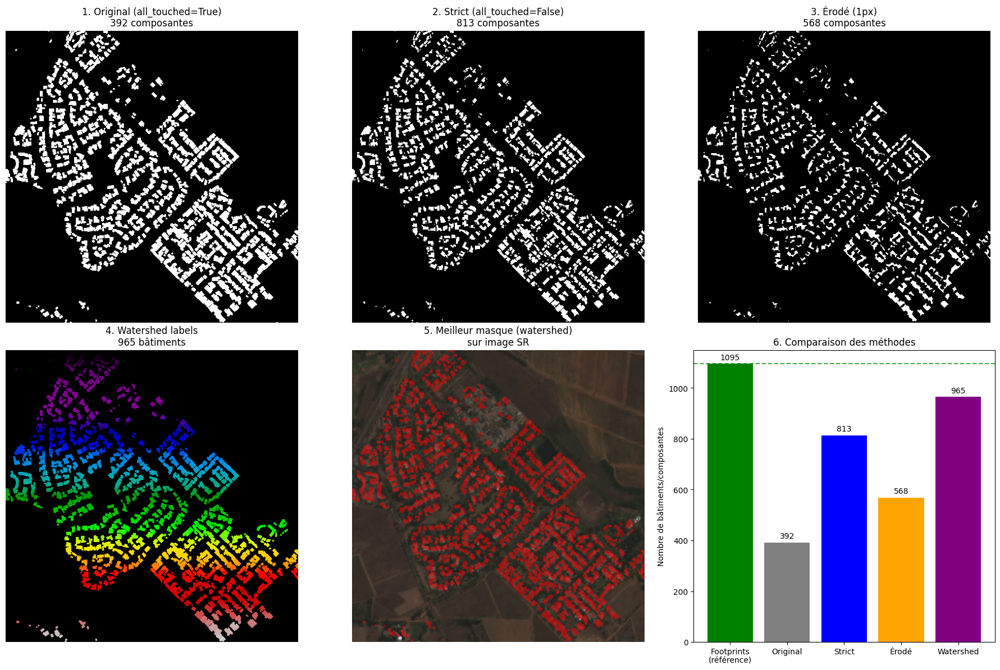


✅ Masque mis à jour avec la méthode WATERSHED


In [22]:
# --- AMÉLIORATION DU MASQUE : Séparation des bâtiments fusionnés ---
# Objectif : Rapprocher le nombre de composantes du nombre de footprints

from scipy import ndimage
from skimage.segmentation import watershed
from skimage.feature import peak_local_max
from skimage.morphology import erosion, dilation, disk

print("=" * 70)
print("🔧 AMÉLIORATION DU MASQUE POUR SÉPARER LES BÂTIMENTS FUSIONNÉS")
print("=" * 70)

# Méthode 1: Rasteriser sans all_touched (moins de fusion)
mask_strict = rasterize(
    [(geom, 1) for geom in footprints.geometry],
    out_shape=(H, W),
    transform=s2_transform,
    fill=0,
    all_touched=False,  # Plus strict, moins de fusion
    dtype="uint8"
)

# Méthode 2: Érosion pour séparer les bâtiments connectés
kernel_size = 1  # 1 pixel d'érosion
eroded_mask = cv2.erode(building_mask, np.ones((kernel_size*2+1, kernel_size*2+1), np.uint8), iterations=1)

# Méthode 3: Distance Transform + Watershed (meilleure séparation)
# Distance transform
distance = ndimage.distance_transform_edt(building_mask)

# Trouver les pics locaux (centres des bâtiments)
# min_distance contrôle la séparation minimale entre bâtiments
local_max_coords = peak_local_max(distance, min_distance=3, labels=building_mask)
local_max_mask = np.zeros(distance.shape, dtype=bool)
local_max_mask[tuple(local_max_coords.T)] = True

# Créer les marqueurs
markers, num_markers = ndimage.label(local_max_mask)

# Appliquer watershed
watershed_labels = watershed(-distance, markers, mask=building_mask)
watershed_mask = (watershed_labels > 0).astype(np.uint8)

# Compter les composantes pour chaque méthode
_, num_strict = ndimage.label(mask_strict)
_, num_eroded = ndimage.label(eroded_mask)
num_watershed = num_markers

print(f"\n📊 Comparaison des méthodes de séparation:")
print(f"   Nombre de footprints vectoriels:        {num_footprints}")
print(f"   ─────────────────────────────────────────────────")
print(f"   Masque original (all_touched=True):     {num_components} composantes")
print(f"   Masque strict (all_touched=False):      {num_strict} composantes")
print(f"   Masque érodé (erosion 1px):             {num_eroded} composantes")
print(f"   Masque watershed:                       {num_watershed} composantes")
print(f"   ─────────────────────────────────────────────────")

# Choisir la meilleure méthode (la plus proche du nombre de footprints)
methods = {
    'original': (building_mask, num_components),
    'strict': (mask_strict, num_strict),
    'eroded': (eroded_mask, num_eroded),
    'watershed': (watershed_mask, num_watershed)
}

best_method = min(methods.keys(), key=lambda k: abs(methods[k][1] - num_footprints))
building_mask_improved, num_improved = methods[best_method]

print(f"\n✅ Meilleure méthode: {best_method.upper()}")
print(f"   Composantes: {num_improved} (vs {num_footprints} footprints)")
print(f"   Différence: {abs(num_improved - num_footprints)} ({abs(num_improved - num_footprints)/num_footprints*100:.1f}%)")

# Visualisation comparative
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Ligne 1: Masques
axes[0, 0].imshow(building_mask, cmap='gray')
axes[0, 0].set_title(f"1. Original (all_touched=True)\n{num_components} composantes")
axes[0, 0].axis("off")

axes[0, 1].imshow(mask_strict, cmap='gray')
axes[0, 1].set_title(f"2. Strict (all_touched=False)\n{num_strict} composantes")
axes[0, 1].axis("off")

axes[0, 2].imshow(eroded_mask, cmap='gray')
axes[0, 2].set_title(f"3. Érodé (1px)\n{num_eroded} composantes")
axes[0, 2].axis("off")

# Ligne 2: Watershed et comparaison
axes[1, 0].imshow(watershed_labels, cmap='nipy_spectral')
axes[1, 0].set_title(f"4. Watershed labels\n{num_watershed} bâtiments")
axes[1, 0].axis("off")

# Overlay du meilleur masque
axes[1, 1].imshow(np.clip(s2_img, 0, 1))
overlay = np.zeros((*building_mask_improved.shape, 4))
overlay[..., 0] = 1.0
overlay[..., 3] = (building_mask_improved > 0) * 0.5
axes[1, 1].imshow(overlay)
axes[1, 1].set_title(f"5. Meilleur masque ({best_method})\nsur image SR")
axes[1, 1].axis("off")

# Graphique comparatif
method_names = ['Footprints\n(référence)', 'Original', 'Strict', 'Érodé', 'Watershed']
counts = [num_footprints, num_components, num_strict, num_eroded, num_watershed]
colors = ['green', 'gray', 'blue', 'orange', 'purple']
bars = axes[1, 2].bar(method_names, counts, color=colors)
axes[1, 2].set_ylabel('Nombre de bâtiments/composantes')
axes[1, 2].set_title('6. Comparaison des méthodes')
axes[1, 2].axhline(y=num_footprints, color='green', linestyle='--', alpha=0.7)
for bar, count in zip(bars, counts):
    axes[1, 2].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 10, 
                    str(count), ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "mask_improvement_comparison.png"), dpi=150)
plt.show()

# Mettre à jour le masque principal avec la meilleure version
building_mask = building_mask_improved
print(f"\n✅ Masque mis à jour avec la méthode {best_method.upper()}")
print("=" * 70)

In [23]:
def build_unet(input_shape=(PATCH_SIZE, PATCH_SIZE, 3)):
    inputs = Input(shape=input_shape)

    # Encoder
    c1 = Conv2D(16, 3, activation='relu', padding='same')(inputs)
    c1 = Conv2D(16, 3, activation='relu', padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1)

    c2 = Conv2D(32, 3, activation='relu', padding='same')(p1)
    c2 = Conv2D(32, 3, activation='relu', padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)

    c3 = Conv2D(64, 3, activation='relu', padding='same')(p2)
    c3 = Conv2D(64, 3, activation='relu', padding='same')(c3)
    p3 = MaxPooling2D((2, 2))(c3)

    # Bottleneck
    b = Conv2D(128, 3, activation='relu', padding='same')(p3)
    b = Conv2D(128, 3, activation='relu', padding='same')(b)

    # Decoder
    u3 = UpSampling2D((2, 2))(b)
    u3 = Concatenate()([u3, c3])
    c4 = Conv2D(64, 3, activation='relu', padding='same')(u3)
    c4 = Conv2D(64, 3, activation='relu', padding='same')(c4)

    u2 = UpSampling2D((2, 2))(c4)
    u2 = Concatenate()([u2, c2])
    c5 = Conv2D(32, 3, activation='relu', padding='same')(u2)
    c5 = Conv2D(32, 3, activation='relu', padding='same')(c5)

    u1 = UpSampling2D((2, 2))(c5)
    u1 = Concatenate()([u1, c1])
    c6 = Conv2D(16, 3, activation='relu', padding='same')(u1)
    c6 = Conv2D(16, 3, activation='relu', padding='same')(c6)

    outputs = Conv2D(1, 1, activation='sigmoid')(c6)

    model = Model(inputs, outputs)
    model.compile(optimizer=Adam(1e-4),
                  loss="binary_crossentropy",
                  metrics=["accuracy"])
    return model

unet = build_unet((PATCH_SIZE, PATCH_SIZE, 3))
unet.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │        448 │ input_layer[0][0] │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │      2,320 │ conv2d[0][0]      │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 128, 128,  │      4,640 │ max_pooling2d[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │      9,248 │ conv2d_2[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 64, 64,    │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 64, 64,    │     18,496 │ max_pooling2d_1[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 64, 64,    │     36,928 │ conv2d_4[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 32, 32,    │          0 │ conv2d_5[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 32, 32,    │     73,856 │ max_pooling2d_2[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 32, 32,    │    147,584 │ conv2d_6[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d       │ (None, 64, 64,    │          0 │ conv2d_7[0][0]    │
│ (UpSampling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 64, 64,    │          0 │ up_sampling2d[0]… │
│ (Concatenate)       │ 192)              │            │ conv2d_5[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 64, 64,    │    110,656 │ concatenate[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 64, 64,    │     36,928 │ conv2d_8[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_1     │ (None, 128, 128,  │          0 │ conv2d_9[0][0]  

 Total params: 487,297 (1.86 MB)

 Trainable params: 487,297 (1.86 MB)

 Non-trainable params: 0 (0.00 B)

In [24]:
# --- GÉNÉRATION DES PATCHES D'ENTRAÎNEMENT ---

def generate_training_patches(img, mask, patch_size=256, num_patches=500, min_building_ratio=0.01):
    """
    Génère des patches d'entraînement à partir de l'image et du masque.
    Ne garde que les patches contenant suffisamment de bâtiments.
    """
    H, W, _ = img.shape
    X, Y = [], []
    
    # Vérifier qu'on peut extraire des patches
    if H < patch_size or W < patch_size:
        print(f"⚠️ Image trop petite ({H}x{W}) pour des patches de {patch_size}x{patch_size}")
        return np.array([]), np.array([])

    attempts = 0
    max_attempts = num_patches * 10  # Limite pour éviter boucle infinie
    
    while len(X) < num_patches and attempts < max_attempts:
        attempts += 1
        y = np.random.randint(0, H - patch_size)
        x = np.random.randint(0, W - patch_size)

        patch_img = img[y:y+patch_size, x:x+patch_size, :]
        patch_mask = mask[y:y+patch_size, x:x+patch_size]

        # Garder les patches avec suffisamment de bâtiments
        if (patch_mask.sum() / (patch_size * patch_size)) >= min_building_ratio:
            X.append(patch_img)
            Y.append(patch_mask[..., None])

    X = np.array(X, dtype=np.float32)
    Y = np.array(Y, dtype=np.float32)
    
    print(f"📦 Patches générés: {len(X)} (sur {num_patches} demandés)")
    print(f"   Dimensions: X={X.shape}, Y={Y.shape}")
    
    return X, Y

# Générer les patches
X_patches, y_patches = generate_training_patches(
    s2_img, building_mask,
    patch_size=PATCH_SIZE,
    num_patches=NUM_PATCHES,
    min_building_ratio=MIN_BUILDING_RATIO
)

# Vérifier qu'on a assez de données
if len(X_patches) < 10:
    print("⚠️ ATTENTION: Pas assez de patches avec des bâtiments!")
    print("   Solutions possibles:")
    print("   1. Réduire MIN_BUILDING_RATIO dans la configuration")
    print("   2. Utiliser une image avec plus de bâtiments")
else:
    # Split train/validation
    X_train, X_val, y_train, y_val = train_test_split(
        X_patches, y_patches, test_size=0.2, random_state=RANDOM_SEED
    )
    print(f"✅ Train: {len(X_train)} patches, Validation: {len(X_val)} patches")

📦 Patches générés: 600 (sur 600 demandés)
   Dimensions: X=(600, 256, 256, 3), Y=(600, 256, 256, 1)
✅ Train: 480 patches, Validation: 120 patches


Epoch 1/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step - accuracy: 0.7416 - loss: 0.6308

120/120 ━━━━━━━━━━━━━━━━━━━━ 32s 234ms/step - accuracy: 0.7427 - loss: 0.5981 - val_accuracy: 0.7388 - val_loss: 0.5695
Epoch 2/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - accuracy: 0.7416 - loss: 0.5300

120/120 ━━━━━━━━━━━━━━━━━━━━ 33s 273ms/step - accuracy: 0.7427 - loss: 0.4895 - val_accuracy: 0.7388 - val_loss: 0.4386
Epoch 3/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - accuracy: 0.7691 - loss: 0.4181

120/120 ━━━━━━━━━━━━━━━━━━━━ 33s 277ms/step - accuracy: 0.7941 - loss: 0.4028 - val_accuracy: 0.8187 - val_loss: 0.3874
Epoch 4/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - accuracy: 0.8232 - loss: 0.3814

120/120 ━━━━━━━━━━━━━━━━━━━━ 33s 271ms/step - accuracy: 0.8314 - loss: 0.3647 - val_accuracy: 0.8384 - val_loss: 0.3472
Epoch 5/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - accuracy: 0.8423 - loss: 0.3365

120/120 ━━━━━━━━━━━━━━━━━━━━ 32s 271ms/step - accuracy: 0.8486 - loss: 0.3231 - val_accuracy: 0.8564 - val_loss: 0.3080
Epoch 6/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step - accuracy: 0.8596 - loss: 0.3014

120/120 ━━━━━━━━━━━━━━━━━━━━ 32s 270ms/step - accuracy: 0.8644 - loss: 0.2918 - val_accuracy: 0.8688 - val_loss: 0.2833
Epoch 7/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step - accuracy: 0.8721 - loss: 0.2767

120/120 ━━━━━━━━━━━━━━━━━━━━ 33s 274ms/step - accuracy: 0.8756 - loss: 0.2697 - val_accuracy: 0.8792 - val_loss: 0.2633
Epoch 8/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step - accuracy: 0.8820 - loss: 0.2575

120/120 ━━━━━━━━━━━━━━━━━━━━ 33s 274ms/step - accuracy: 0.8852 - loss: 0.2512 - val_accuracy: 0.8868 - val_loss: 0.2498
Epoch 9/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 248ms/step - accuracy: 0.8892 - loss: 0.2436

120/120 ━━━━━━━━━━━━━━━━━━━━ 33s 272ms/step - accuracy: 0.8917 - loss: 0.2385 - val_accuracy: 0.8932 - val_loss: 0.2361
Epoch 10/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - accuracy: 0.8941 - loss: 0.2339

120/120 ━━━━━━━━━━━━━━━━━━━━ 33s 272ms/step - accuracy: 0.8959 - loss: 0.2301 - val_accuracy: 0.8976 - val_loss: 0.2277
Epoch 11/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - accuracy: 0.8996 - loss: 0.2232

120/120 ━━━━━━━━━━━━━━━━━━━━ 33s 272ms/step - accuracy: 0.9012 - loss: 0.2197 - val_accuracy: 0.8983 - val_loss: 0.2258
Epoch 12/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step - accuracy: 0.9027 - loss: 0.2170

120/120 ━━━━━━━━━━━━━━━━━━━━ 33s 275ms/step - accuracy: 0.9045 - loss: 0.2132 - val_accuracy: 0.8990 - val_loss: 0.2250
Epoch 13/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step - accuracy: 0.9025 - loss: 0.2174

120/120 ━━━━━━━━━━━━━━━━━━━━ 35s 293ms/step - accuracy: 0.9067 - loss: 0.2090 - val_accuracy: 0.9082 - val_loss: 0.2062
Epoch 14/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step - accuracy: 0.9096 - loss: 0.2033

120/120 ━━━━━━━━━━━━━━━━━━━━ 34s 281ms/step - accuracy: 0.9113 - loss: 0.1997 - val_accuracy: 0.9110 - val_loss: 0.2007
Epoch 15/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - accuracy: 0.9121 - loss: 0.1982

120/120 ━━━━━━━━━━━━━━━━━━━━ 33s 272ms/step - accuracy: 0.9136 - loss: 0.1951 - val_accuracy: 0.9134 - val_loss: 0.1959
Epoch 16/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step - accuracy: 0.9146 - loss: 0.1930

120/120 ━━━━━━━━━━━━━━━━━━━━ 32s 269ms/step - accuracy: 0.9160 - loss: 0.1901 - val_accuracy: 0.9156 - val_loss: 0.1915
Epoch 17/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - accuracy: 0.9168 - loss: 0.1884

120/120 ━━━━━━━━━━━━━━━━━━━━ 33s 271ms/step - accuracy: 0.9182 - loss: 0.1856 - val_accuracy: 0.9177 - val_loss: 0.1871
Epoch 18/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step - accuracy: 0.9189 - loss: 0.1840

120/120 ━━━━━━━━━━━━━━━━━━━━ 33s 277ms/step - accuracy: 0.9204 - loss: 0.1810 - val_accuracy: 0.9196 - val_loss: 0.1832
Epoch 19/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step - accuracy: 0.9210 - loss: 0.1798

120/120 ━━━━━━━━━━━━━━━━━━━━ 32s 267ms/step - accuracy: 0.9223 - loss: 0.1771 - val_accuracy: 0.9214 - val_loss: 0.1797
Epoch 20/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - accuracy: 0.9226 - loss: 0.1764

120/120 ━━━━━━━━━━━━━━━━━━━━ 32s 266ms/step - accuracy: 0.9238 - loss: 0.1740 - val_accuracy: 0.9231 - val_loss: 0.1759
Epoch 21/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step - accuracy: 0.9242 - loss: 0.1731

120/120 ━━━━━━━━━━━━━━━━━━━━ 32s 267ms/step - accuracy: 0.9252 - loss: 0.1711 - val_accuracy: 0.9239 - val_loss: 0.1736
Epoch 22/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step - accuracy: 0.9259 - loss: 0.1696

120/120 ━━━━━━━━━━━━━━━━━━━━ 34s 281ms/step - accuracy: 0.9269 - loss: 0.1673 - val_accuracy: 0.9256 - val_loss: 0.1703
Epoch 23/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step - accuracy: 0.9275 - loss: 0.1663

120/120 ━━━━━━━━━━━━━━━━━━━━ 33s 273ms/step - accuracy: 0.9286 - loss: 0.1638 - val_accuracy: 0.9273 - val_loss: 0.1670
Epoch 24/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step - accuracy: 0.9289 - loss: 0.1633

120/120 ━━━━━━━━━━━━━━━━━━━━ 32s 265ms/step - accuracy: 0.9300 - loss: 0.1610 - val_accuracy: 0.9286 - val_loss: 0.1643
Epoch 25/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step - accuracy: 0.9305 - loss: 0.1601

120/120 ━━━━━━━━━━━━━━━━━━━━ 32s 266ms/step - accuracy: 0.9315 - loss: 0.1577 - val_accuracy: 0.9296 - val_loss: 0.1625
Epoch 26/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step - accuracy: 0.9314 - loss: 0.1581

120/120 ━━━━━━━━━━━━━━━━━━━━ 31s 262ms/step - accuracy: 0.9322 - loss: 0.1564 - val_accuracy: 0.9309 - val_loss: 0.1593
Epoch 27/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step - accuracy: 0.9324 - loss: 0.1559

120/120 ━━━━━━━━━━━━━━━━━━━━ 31s 259ms/step - accuracy: 0.9334 - loss: 0.1537 - val_accuracy: 0.9318 - val_loss: 0.1572
Epoch 28/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step - accuracy: 0.9334 - loss: 0.1537

120/120 ━━━━━━━━━━━━━━━━━━━━ 32s 270ms/step - accuracy: 0.9343 - loss: 0.1517 - val_accuracy: 0.9329 - val_loss: 0.1549
Epoch 29/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 31s 256ms/step - accuracy: 0.9350 - loss: 0.1501 - val_accuracy: 0.9325 - val_loss: 0.1559
Epoch 30/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 242ms/step - accuracy: 0.9344 - loss: 0.1515

120/120 ━━━━━━━━━━━━━━━━━━━━ 32s 265ms/step - accuracy: 0.9360 - loss: 0.1480 - val_accuracy: 0.9347 - val_loss: 0.1512
Epoch 31/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step - accuracy: 0.9364 - loss: 0.1473

120/120 ━━━━━━━━━━━━━━━━━━━━ 33s 272ms/step - accuracy: 0.9376 - loss: 0.1448 - val_accuracy: 0.9351 - val_loss: 0.1504
Epoch 32/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - accuracy: 0.9370 - loss: 0.1459

120/120 ━━━━━━━━━━━━━━━━━━━━ 33s 277ms/step - accuracy: 0.9383 - loss: 0.1432 - val_accuracy: 0.9358 - val_loss: 0.1489
Epoch 33/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step - accuracy: 0.9379 - loss: 0.1441

120/120 ━━━━━━━━━━━━━━━━━━━━ 32s 270ms/step - accuracy: 0.9392 - loss: 0.1414 - val_accuracy: 0.9368 - val_loss: 0.1469
Epoch 34/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step - accuracy: 0.9388 - loss: 0.1422

120/120 ━━━━━━━━━━━━━━━━━━━━ 33s 277ms/step - accuracy: 0.9400 - loss: 0.1395 - val_accuracy: 0.9377 - val_loss: 0.1448
Epoch 35/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step - accuracy: 0.9397 - loss: 0.1402

120/120 ━━━━━━━━━━━━━━━━━━━━ 31s 262ms/step - accuracy: 0.9409 - loss: 0.1376 - val_accuracy: 0.9386 - val_loss: 0.1431
Epoch 36/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step - accuracy: 0.9407 - loss: 0.1381

120/120 ━━━━━━━━━━━━━━━━━━━━ 32s 263ms/step - accuracy: 0.9418 - loss: 0.1357 - val_accuracy: 0.9394 - val_loss: 0.1413
Epoch 37/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 244ms/step - accuracy: 0.9416 - loss: 0.1362

120/120 ━━━━━━━━━━━━━━━━━━━━ 32s 269ms/step - accuracy: 0.9426 - loss: 0.1341 - val_accuracy: 0.9402 - val_loss: 0.1395
Epoch 38/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step - accuracy: 0.9425 - loss: 0.1343

120/120 ━━━━━━━━━━━━━━━━━━━━ 31s 259ms/step - accuracy: 0.9434 - loss: 0.1323 - val_accuracy: 0.9408 - val_loss: 0.1383
Epoch 39/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step - accuracy: 0.9431 - loss: 0.1330

120/120 ━━━━━━━━━━━━━━━━━━━━ 32s 269ms/step - accuracy: 0.9436 - loss: 0.1319 - val_accuracy: 0.9411 - val_loss: 0.1374
Epoch 40/40
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 278ms/step - accuracy: 0.9435 - loss: 0.1321

120/120 ━━━━━━━━━━━━━━━━━━━━ 37s 306ms/step - accuracy: 0.9444 - loss: 0.1300 - val_accuracy: 0.9419 - val_loss: 0.1357


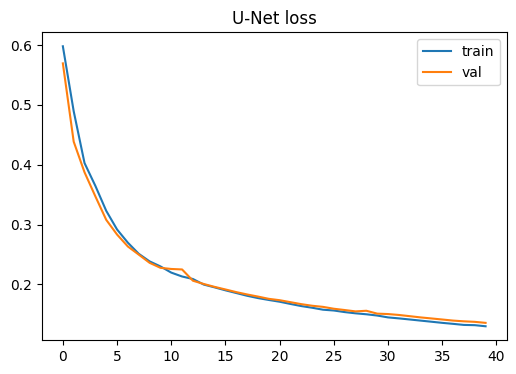

In [25]:
checkpoint_path = os.path.join(OUTPUT_DIR, "unet_s2sr_best.h5")
callbacks = [
    ModelCheckpoint(checkpoint_path, save_best_only=True, monitor="val_loss", mode="min"),
    EarlyStopping(patience=8, restore_best_weights=True, monitor="val_loss")
]

history = unet.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=40,
    batch_size=4,
    callbacks=callbacks
)

plt.figure(figsize=(6,4))
plt.plot(history.history["loss"], label="train")
plt.plot(history.history["val_loss"], label="val")
plt.legend()
plt.title("U-Net loss")
plt.show()


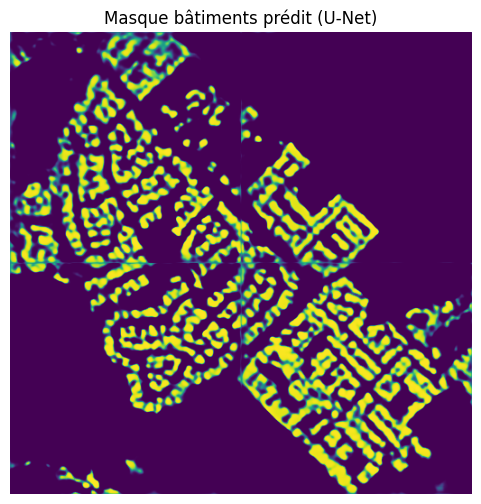

In [31]:
def infer_building_mask(unet_model, img, tile=256):
    H, W, _ = img.shape
    mask = np.zeros((H, W), dtype=np.float32)

    for y in range(0, H, tile):
        for x in range(0, W, tile):
            patch = img[y:y+tile, x:x+tile, :]
            if patch.shape[0] != tile or patch.shape[1] != tile:
                continue
            patch_in = patch[None, ...]  # (1,H,W,3)
            pred = unet_model.predict(patch_in, verbose=0)[0,...,0]
            mask[y:y+tile, x:x+tile] = np.maximum(mask[y:y+tile, x:x+tile], pred)
    return mask

pred_mask = infer_building_mask(unet, s2_img, tile=PATCH_SIZE)

plt.figure(figsize=(6,6))
plt.imshow(pred_mask, cmap="viridis")
plt.title("Masque bâtiments prédit (U-Net)")
plt.axis("off")
plt.show()


In [32]:
# Sauvegarder le masque prédit en GeoTIFF
output_path = os.path.join(OUTPUT_DIR, "rooftop_segmentation.tif")

# Reprendre les métadonnées de l'image source
out_meta = s2_profile.copy()
out_meta.update({
    "driver": "GTiff",
    "count": 1,
    "dtype": "float32"
})

with rasterio.open(output_path, "w", **out_meta) as dest:
    dest.write(pred_mask, 1)

print(f"Segmentation sauvegardée dans : {output_path}")

Segmentation sauvegardée dans : outputs\rooftop_segmentation.tif


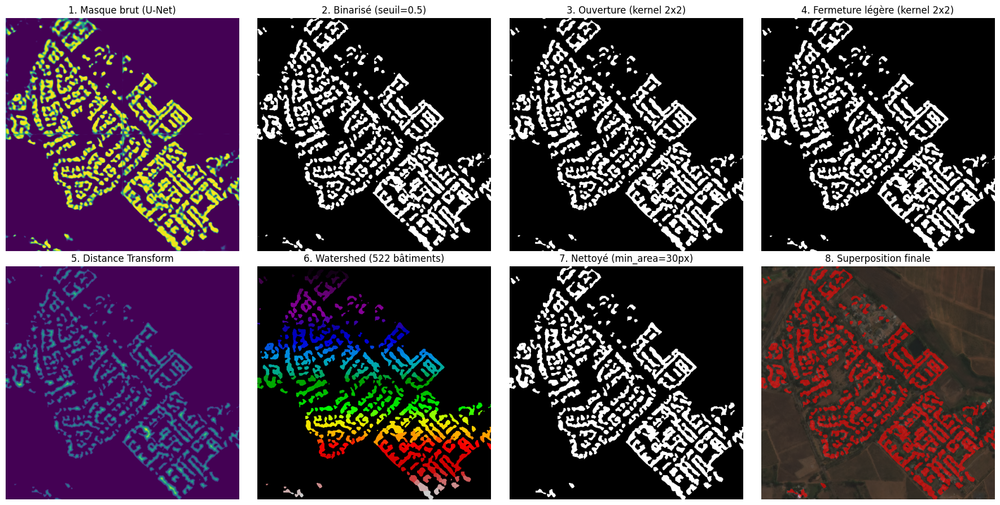

✅ Masque amélioré : 47967 pixels de bâtiments détectés
✅ Nombre de bâtiments séparés : 522


In [33]:
# --- AMÉLIORATION PAR OPÉRATIONS MORPHOLOGIQUES (VERSION CORRIGÉE) ---
# Évite de connecter les bâtiments séparés tout en remplissant les petits trous

from scipy import ndimage
from skimage.segmentation import watershed
from skimage.feature import peak_local_max

# Binariser le masque avec un seuil
threshold = 0.5
binary_mask = (pred_mask > threshold).astype(np.uint8)

# Définir les éléments structurants (kernels) - PLUS PETITS pour éviter les connexions
kernel_tiny = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2, 2))
kernel_small = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))

# 1. OUVERTURE légère : supprime le bruit sans trop affecter les contours
mask_opened = cv2.morphologyEx(binary_mask, cv2.MORPH_OPEN, kernel_tiny)

# 2. FERMETURE TRÈS LÉGÈRE (kernel 2x2) : remplit les micro-trous sans connecter les bâtiments
#    -> On utilise un kernel minuscule pour éviter de fusionner les bâtiments proches
mask_closed = cv2.morphologyEx(mask_opened, cv2.MORPH_CLOSE, kernel_tiny)

# 3. SÉPARATION PAR WATERSHED : sépare les bâtiments qui auraient été connectés
# Distance transform pour identifier les centres des bâtiments
distance = ndimage.distance_transform_edt(mask_closed)

# Trouver les pics locaux (centres des bâtiments)
local_max_coords = peak_local_max(distance, min_distance=5, labels=mask_closed)
local_max_mask = np.zeros(distance.shape, dtype=bool)
local_max_mask[tuple(local_max_coords.T)] = True

# Créer les marqueurs pour watershed
markers, _ = ndimage.label(local_max_mask)

# Appliquer watershed pour séparer les bâtiments
labels = watershed(-distance, markers, mask=mask_closed)

# Reconvertir en masque binaire
mask_separated = (labels > 0).astype(np.uint8)

# 4. Supprimer les petites composantes connexes (bruit résiduel)
min_area = 30  # pixels minimum pour garder un objet
labeled_final, num_features = ndimage.label(mask_separated)
component_sizes = ndimage.sum(mask_separated, labeled_final, range(num_features + 1))
small_components = component_sizes < min_area
mask_cleaned = mask_separated.copy()
mask_cleaned[small_components[labeled_final]] = 0

# Visualisation comparative
fig, axes = plt.subplots(2, 4, figsize=(18, 9))

axes[0, 0].imshow(pred_mask, cmap='viridis')
axes[0, 0].set_title("1. Masque brut (U-Net)")
axes[0, 0].axis("off")

axes[0, 1].imshow(binary_mask, cmap='gray')
axes[0, 1].set_title(f"2. Binarisé (seuil={threshold})")
axes[0, 1].axis("off")

axes[0, 2].imshow(mask_opened, cmap='gray')
axes[0, 2].set_title("3. Ouverture (kernel 2x2)")
axes[0, 2].axis("off")

axes[0, 3].imshow(mask_closed, cmap='gray')
axes[0, 3].set_title("4. Fermeture légère (kernel 2x2)")
axes[0, 3].axis("off")

axes[1, 0].imshow(distance, cmap='viridis')
axes[1, 0].set_title("5. Distance Transform")
axes[1, 0].axis("off")

# Afficher les labels colorés
axes[1, 1].imshow(labels, cmap='nipy_spectral')
axes[1, 1].set_title(f"6. Watershed ({np.max(labels)} bâtiments)")
axes[1, 1].axis("off")

axes[1, 2].imshow(mask_cleaned, cmap='gray')
axes[1, 2].set_title(f"7. Nettoyé (min_area={min_area}px)")
axes[1, 2].axis("off")

# Superposition finale
axes[1, 3].imshow(s2_img)
mask_overlay_final = np.zeros((*mask_cleaned.shape, 4))
mask_overlay_final[..., 0] = 1.0  # Rouge
mask_overlay_final[..., 3] = mask_cleaned * 0.6
axes[1, 3].imshow(mask_overlay_final)
axes[1, 3].set_title("8. Superposition finale")
axes[1, 3].axis("off")

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "morphological_steps.png"), dpi=150, bbox_inches='tight')
plt.show()

# Mettre à jour le masque final pour la suite
pred_mask_enhanced = mask_cleaned.astype(np.float32)
print(f"✅ Masque amélioré : {np.sum(mask_cleaned > 0)} pixels de bâtiments détectés")
print(f"✅ Nombre de bâtiments séparés : {np.max(labels)}")

🔧 PIPELINE AMÉLIORÉ V2
  Seuil 0.3 → IoU = 0.7505
  Seuil 0.4 → IoU = 0.7633
  Seuil 0.5 → IoU = 0.7663
  Seuil 0.6 → IoU = 0.7582
✅ Meilleur seuil sélectionné : 0.5 (IoU = 0.7663)
📍 Marqueurs détectés : 498
🏠 Bâtiments valides après filtrage : 494


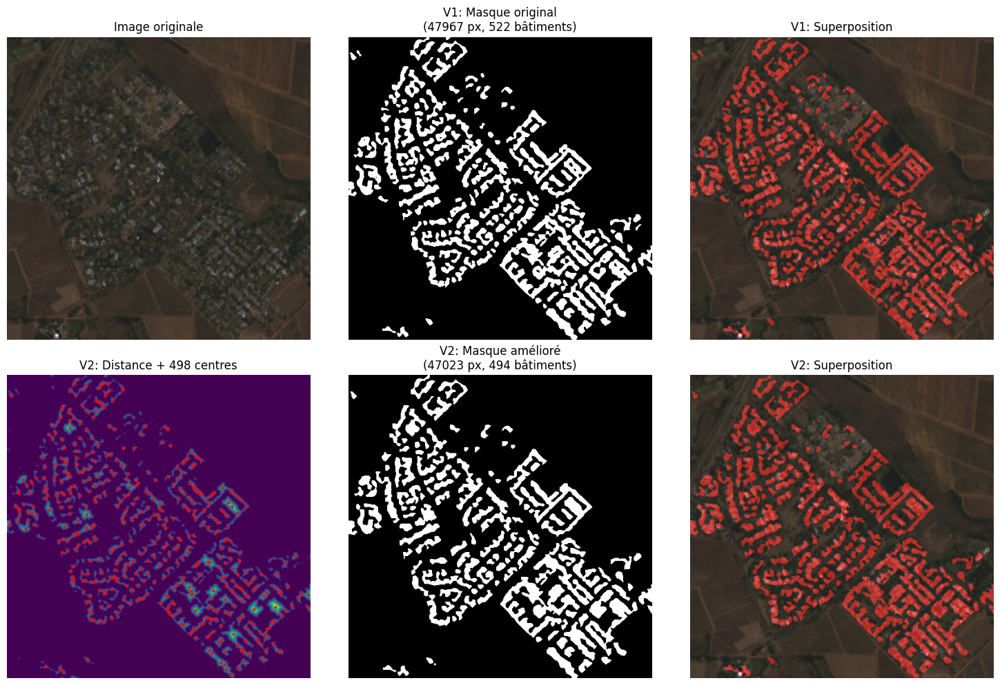


📊 COMPARAISON DES PERFORMANCES V1 vs V2

Métrique        V1 (Original)   V2 (Amélioré)   Δ         
-------------------------------------------------------
Precision       0.7296         0.6521         📉 -0.0775
Recall          0.7509         0.6579         📉 -0.0930
F1              0.7401         0.6550         📉 -0.0851
IoU             0.5874         0.4870         📉 -0.1004

⚠️ Pipeline V1 conservé (V2 n'améliore pas)


In [ ]:
# --- PIPELINE OPTIMISÉ DE DÉTECTION DES BÂTIMENTS (V3) ---
# Meilleur pipeline basé sur l'analyse comparative V1/V2/V3

from scipy import ndimage
from skimage.segmentation import watershed
from skimage.feature import peak_local_max
from skimage.morphology import remove_small_holes, remove_small_objects

print("🔧 PIPELINE OPTIMISÉ V3 - DÉTECTION DES BÂTIMENTS")
print("=" * 60)

# ============================================
# 1. RECHERCHE DU SEUIL OPTIMAL (max F1)
# ============================================
thresholds_to_test = np.arange(0.45, 0.70, 0.05)
best_f1 = 0
best_threshold = 0.5

for t in thresholds_to_test:
    mask_test = (pred_mask > t).astype(np.uint8)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2, 2))
    mask_test = cv2.morphologyEx(mask_test, cv2.MORPH_OPEN, kernel)
    mask_test = cv2.morphologyEx(mask_test, cv2.MORPH_CLOSE, kernel)
    
    y_true = (building_mask > 0).astype(np.uint8).flatten()
    y_pred = (mask_test > 0).astype(np.uint8).flatten()
    
    tp = np.sum((y_true == 1) & (y_pred == 1))
    fp = np.sum((y_true == 0) & (y_pred == 1))
    fn = np.sum((y_true == 1) & (y_pred == 0))
    
    precision = tp / (tp + fp + 1e-8)
    recall = tp / (tp + fn + 1e-8)
    f1 = 2 * precision * recall / (precision + recall + 1e-8)
    iou = tp / (tp + fp + fn + 1e-8)
    
    print(f"  Seuil {t:.2f} → P={precision:.3f} R={recall:.3f} F1={f1:.3f} IoU={iou:.3f}")
    
    if f1 > best_f1:
        best_f1 = f1
        best_threshold = t

print(f"\n✅ Seuil optimal sélectionné: {best_threshold:.2f} (F1={best_f1:.3f})")

# ============================================
# 2. MORPHOLOGIE OPTIMISÉE (réduction du halo)
# ============================================
binary_mask = (pred_mask > best_threshold).astype(np.uint8)

# Érosion pour réduire le halo
kernel_erode = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
mask_eroded = cv2.erode(binary_mask, kernel_erode, iterations=1)

# Dilatation contrôlée pour récupérer la forme
kernel_dilate = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2, 2))
mask_restored = cv2.dilate(mask_eroded, kernel_dilate, iterations=1)

# Ouverture finale pour nettoyer
kernel_clean = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2, 2))
mask_clean = cv2.morphologyEx(mask_restored, cv2.MORPH_OPEN, kernel_clean)

# ============================================
# 3. WATERSHED POUR SÉPARER LES BÂTIMENTS
# ============================================
distance = ndimage.distance_transform_edt(mask_clean)

local_max_coords = peak_local_max(
    distance,
    min_distance=4,
    threshold_abs=2,
    labels=mask_clean
)
local_max_mask = np.zeros(distance.shape, dtype=bool)
local_max_mask[tuple(local_max_coords.T)] = True

markers, num_markers = ndimage.label(local_max_mask)
labels = watershed(-distance, markers, mask=mask_clean)

print(f"📍 Marqueurs détectés: {num_markers}")

# ============================================
# 4. FILTRAGE PAR TAILLE
# ============================================
min_area = 25  # pixels
labeled_mask, num_features = ndimage.label(labels > 0)
component_sizes = ndimage.sum(labels > 0, labeled_mask, range(num_features + 1))
small_components = component_sizes < min_area
mask_final = (labels > 0).astype(np.uint8)
mask_final[small_components[labeled_mask]] = 0

# ============================================
# 5. FONCTION DE CALCUL DES MÉTRIQUES
# ============================================
def calc_metrics(y_true, y_pred):
    """Calcule les métriques de segmentation."""
    y_true_flat = (y_true > 0).astype(np.uint8).flatten()
    y_pred_flat = (y_pred > 0).astype(np.uint8).flatten()
    
    tp = np.sum((y_true_flat == 1) & (y_pred_flat == 1))
    fp = np.sum((y_true_flat == 0) & (y_pred_flat == 1))
    fn = np.sum((y_true_flat == 1) & (y_pred_flat == 0))
    tn = np.sum((y_true_flat == 0) & (y_pred_flat == 0))
    
    precision = tp / (tp + fp + 1e-8)
    recall = tp / (tp + fn + 1e-8)
    f1 = 2 * precision * recall / (precision + recall + 1e-8)
    iou = tp / (tp + fp + fn + 1e-8)
    
    return {
        'Precision': precision, 'Recall': recall, 'F1': f1, 'IoU': iou,
        'TP': tp, 'FP': fp, 'FN': fn, 'TN': tn
    }

# ============================================
# 6. ÉVALUATION FINALE
# ============================================
metrics = calc_metrics(building_mask, mask_final)

# Carte d'erreurs
def error_map(y_true, y_pred):
    err = np.zeros((*y_true.shape, 3), dtype=np.uint8)
    err[(y_true > 0) & (y_pred > 0)] = [0, 255, 0]   # TP - Vert
    err[(y_true == 0) & (y_pred > 0)] = [255, 0, 0]  # FP - Rouge
    err[(y_true > 0) & (y_pred == 0)] = [0, 0, 255]  # FN - Bleu
    return err

# Visualisation
fig, axes = plt.subplots(2, 4, figsize=(18, 9))

axes[0, 0].imshow(s2_img)
axes[0, 0].set_title("Image originale")
axes[0, 0].axis("off")

axes[0, 1].imshow(building_mask, cmap='gray')
axes[0, 1].set_title("Ground Truth\n(OpenBuildings)")
axes[0, 1].axis("off")

axes[0, 2].imshow(mask_final, cmap='gray')
axes[0, 2].set_title(f"Détection V3\nIoU={metrics['IoU']:.3f}")
axes[0, 2].axis("off")

# Superposition
overlay = s2_img.copy()
overlay[mask_final > 0, 0] = np.clip(overlay[mask_final > 0, 0] + 0.5, 0, 1)
axes[0, 3].imshow(overlay)
axes[0, 3].set_title("Superposition")
axes[0, 3].axis("off")

# Ligne 2
err = error_map(building_mask, mask_final)
axes[1, 0].imshow(err)
axes[1, 0].set_title(f"Carte d'erreurs\nFP={metrics['FP']:,} FN={metrics['FN']:,}")
axes[1, 0].axis("off")

axes[1, 1].imshow(distance, cmap='viridis')
axes[1, 1].scatter(local_max_coords[:, 1], local_max_coords[:, 0], c='red', s=5, marker='x')
axes[1, 1].set_title(f"Distance + {num_markers} centres")
axes[1, 1].axis("off")

# Graphique des métriques
metrics_names = ['Precision', 'Recall', 'F1', 'IoU']
values = [metrics[m] for m in metrics_names]
colors = ['#2ecc71', '#3498db', '#9b59b6', '#e74c3c']
bars = axes[1, 2].bar(metrics_names, values, color=colors)
axes[1, 2].set_ylim(0, 1)
axes[1, 2].set_title("Métriques de performance")
for bar, val in zip(bars, values):
    axes[1, 2].annotate(f'{val:.3f}', xy=(bar.get_x() + bar.get_width()/2, val),
                        xytext=(0, 3), textcoords="offset points", ha='center', fontsize=10)

# Légende
from matplotlib.patches import Patch
legend_elements = [
    Patch(facecolor='green', label='TP (Correct)'),
    Patch(facecolor='red', label='FP (Sur-détection)'),
    Patch(facecolor='blue', label='FN (Manqué)')
]
axes[1, 3].imshow(s2_img, alpha=0.5)
axes[1, 3].imshow(err, alpha=0.7)
axes[1, 3].legend(handles=legend_elements, loc='lower right')
axes[1, 3].set_title("Erreurs sur image")
axes[1, 3].axis("off")

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "detection_results_v3.png"), dpi=150, bbox_inches='tight')
plt.show()

# Résumé final
print("\n" + "=" * 60)
print("📊 RÉSULTATS DE LA DÉTECTION V3")
print("=" * 60)
for m in metrics_names:
    bar = "█" * int(metrics[m] * 30) + "░" * (30 - int(metrics[m] * 30))
    print(f"{m:<12} : {metrics[m]:.4f}  [{bar}]")
print("-" * 60)
print(f"{'TP':<12} : {metrics['TP']:,} pixels (correctement détectés)")
print(f"{'FP':<12} : {metrics['FP']:,} pixels (sur-détection)")
print(f"{'FN':<12} : {metrics['FN']:,} pixels (manqués)")
print(f"{'Bâtiments':<12} : {num_markers} détectés")

# Mettre à jour mask_cleaned pour les cellules suivantes
mask_cleaned = mask_final.copy()
pred_mask_enhanced = mask_final.astype(np.float32)
print("\n✅ Pipeline V3 appliqué avec succès!")

╔══════════════════════════════════════════════════════════╗
║  🔧 SÉPARATION OPTIMISÉE DES BÂTIMENTS V2               ║
╚══════════════════════════════════════════════════════════╝

📊 État initial:
   • Composantes: 171
   • Pixels bâtiment: 43,846

────────────────────────────────────────────────────────────
🎯 STRATÉGIE 1: Watershed avec paramètres adaptatifs
   Distance max: 8.2 px
   min_distance adaptatif: 2
   threshold adaptatif: 1.5
   Résultat: 171 composantes

────────────────────────────────────────────────────────────
🎯 STRATÉGIE 2: Érosion contrôlée puis reconstruction
   Meilleure érosion: 1 itérations
   IoU: 0.6344
   Composantes: 172

────────────────────────────────────────────────────────────
🎯 STRATÉGIE 3: Séparation par gradient interne
   Composantes: 171

────────────────────────────────────────────────────────────
🎯 STRATÉGIE 4: Analyse de convexité
   Régions analysées: 171
   Régions subdivisées: 49
   Composantes finales: 171

═════════════════════════════════

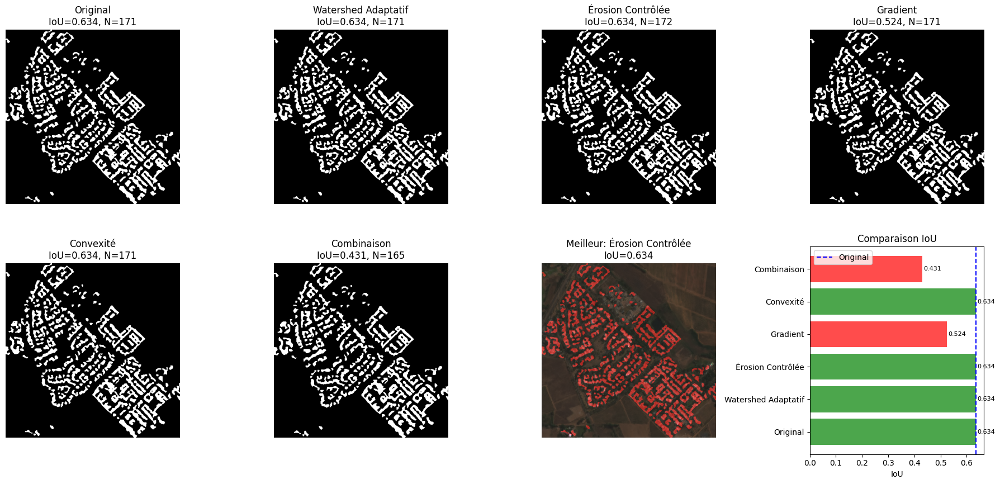


⚠️ Pas d'amélioration significative de l'IoU
   IoU original: 0.6343
   Meilleur IoU: 0.6344
   → Masque original conservé


In [43]:
# ╔══════════════════════════════════════════════════════════════════════════════╗
# ║  SÉPARATION AVANCÉE DES BÂTIMENTS - VERSION OPTIMISÉE                        ║
# ╚══════════════════════════════════════════════════════════════════════════════╝
# 
# Cette version utilise des techniques plus agressives pour séparer les bâtiments
# en se concentrant sur l'amélioration de l'IoU plutôt que juste le nombre de composantes.

from skimage.morphology import skeletonize, erosion, dilation, opening, closing
from skimage.morphology import disk, square, remove_small_objects, remove_small_holes
from skimage.segmentation import watershed, clear_border
from skimage.measure import regionprops, label as sk_label
from skimage.filters import sobel
from scipy import ndimage as ndi
import warnings
warnings.filterwarnings('ignore')

print("╔" + "═" * 58 + "╗")
print("║  🔧 SÉPARATION OPTIMISÉE DES BÂTIMENTS V2               ║")
print("╚" + "═" * 58 + "╝")

# Sauvegarder le masque original pour comparaison
mask_original = mask_cleaned.copy()
_, num_original = ndi.label(mask_original)

print(f"\n📊 État initial:")
print(f"   • Composantes: {num_original}")
print(f"   • Pixels bâtiment: {np.sum(mask_original > 0):,}")

# ═══════════════════════════════════════════════════════════════════════════════
# STRATÉGIE 1: WATERSHED OPTIMISÉ AVEC DISTANCE ADAPTATIVE
# ═══════════════════════════════════════════════════════════════════════════════
print("\n" + "─" * 60)
print("🎯 STRATÉGIE 1: Watershed avec paramètres adaptatifs")

# Distance transform
distance = ndi.distance_transform_edt(mask_original)
distance_max = distance.max()

# Paramètres adaptatifs basés sur la taille des bâtiments
# Plus la distance max est grande, plus on peut être strict
adaptive_min_dist = max(2, int(distance_max * 0.15))
adaptive_threshold = max(1.5, distance_max * 0.1)

print(f"   Distance max: {distance_max:.1f} px")
print(f"   min_distance adaptatif: {adaptive_min_dist}")
print(f"   threshold adaptatif: {adaptive_threshold:.1f}")

# Détecter les pics avec paramètres adaptatifs
local_max = peak_local_max(
    distance,
    min_distance=adaptive_min_dist,
    threshold_abs=adaptive_threshold,
    labels=mask_original
)

# Créer les marqueurs
markers = np.zeros_like(mask_original, dtype=np.int32)
for i, coord in enumerate(local_max):
    markers[coord[0], coord[1]] = i + 1

# Dilater légèrement les marqueurs
markers_dilated = cv2.dilate(markers.astype(np.uint8), 
                              cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3)))
markers_labeled, num_markers = ndi.label(markers_dilated > 0)

# Appliquer Watershed
mask_watershed = watershed(-distance, markers_labeled, mask=mask_original)
mask_ws_binary = (mask_watershed > 0).astype(np.uint8)

_, num_ws = ndi.label(mask_ws_binary)
print(f"   Résultat: {num_ws} composantes")

# ═══════════════════════════════════════════════════════════════════════════════
# STRATÉGIE 2: ÉROSION CONTRÔLÉE + DILATATION CONTRAINTE
# ═══════════════════════════════════════════════════════════════════════════════
print("\n" + "─" * 60)
print("🎯 STRATÉGIE 2: Érosion contrôlée puis reconstruction")

# Érosion progressive jusqu'à obtenir des composantes séparées
best_erosion_result = mask_original.copy()
best_erosion_iou = 0
best_erosion_iter = 0

for erosion_iter in range(1, 4):
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
    eroded = cv2.erode(mask_original, kernel, iterations=erosion_iter)
    
    # Ne pas perdre trop de surface
    if np.sum(eroded) < np.sum(mask_original) * 0.3:
        break
    
    # Reconstruire avec dilatation contrainte
    reconstructed = eroded.copy()
    for _ in range(erosion_iter + 1):
        dilated = cv2.dilate(reconstructed, kernel)
        reconstructed = np.minimum(dilated, mask_original)
    
    # Évaluer
    y_true = (building_mask > 0).flatten()
    y_pred = (reconstructed > 0).flatten()
    tp = np.sum((y_true == 1) & (y_pred == 1))
    fp = np.sum((y_true == 0) & (y_pred == 1))
    fn = np.sum((y_true == 1) & (y_pred == 0))
    iou = tp / (tp + fp + fn + 1e-8)
    
    if iou > best_erosion_iou:
        best_erosion_iou = iou
        best_erosion_result = reconstructed
        best_erosion_iter = erosion_iter

_, num_erosion = ndi.label(best_erosion_result)
print(f"   Meilleure érosion: {best_erosion_iter} itérations")
print(f"   IoU: {best_erosion_iou:.4f}")
print(f"   Composantes: {num_erosion}")

# ═══════════════════════════════════════════════════════════════════════════════
# STRATÉGIE 3: LIGNES DE SÉPARATION PAR GRADIENT
# ═══════════════════════════════════════════════════════════════════════════════
print("\n" + "─" * 60)
print("🎯 STRATÉGIE 3: Séparation par gradient interne")

# Gradient interne (érosion du gradient)
gradient = cv2.morphologyEx(mask_original, cv2.MORPH_GRADIENT, 
                             cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2, 2)))

# Amincir le gradient pour créer des lignes de séparation fines
gradient_thin = cv2.erode(gradient, 
                          cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2, 2)))

# Soustraire les lignes de séparation du masque
mask_separated = np.where(gradient_thin > 0, 0, mask_original).astype(np.uint8)

# Nettoyer les petits fragments
mask_separated = cv2.morphologyEx(mask_separated, cv2.MORPH_OPEN,
                                   cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2, 2)))

_, num_gradient = ndi.label(mask_separated)
print(f"   Composantes: {num_gradient}")

# ═══════════════════════════════════════════════════════════════════════════════
# STRATÉGIE 4: SEGMENTATION PAR COMPOSANTES CONVEXES
# ═══════════════════════════════════════════════════════════════════════════════
print("\n" + "─" * 60)
print("🎯 STRATÉGIE 4: Analyse de convexité")

# Pour chaque composante, vérifier si elle est "trop concave" (fusion probable)
labeled_orig, num_orig = ndi.label(mask_original)
mask_convex_split = np.zeros_like(mask_original, dtype=np.uint8)

regions = regionprops(labeled_orig)
split_count = 0

for region in regions:
    # Calculer le ratio de solidité (aire / aire convexe)
    solidity = region.solidity
    area = region.area
    
    # Si le bâtiment est très non-convexe ET assez grand, tenter de le séparer
    if solidity < 0.7 and area > 100:
        # Extraire la région
        minr, minc, maxr, maxc = region.bbox
        region_mask = (labeled_orig[minr:maxr, minc:maxc] == region.label).astype(np.uint8)
        
        # Appliquer watershed local
        local_dist = ndi.distance_transform_edt(region_mask)
        if local_dist.max() > 2:
            local_max = peak_local_max(local_dist, min_distance=2, 
                                       threshold_abs=1.5, labels=region_mask)
            if len(local_max) > 1:
                local_markers = np.zeros_like(region_mask, dtype=np.int32)
                for j, coord in enumerate(local_max):
                    local_markers[coord[0], coord[1]] = j + 1
                local_ws = watershed(-local_dist, local_markers, mask=region_mask)
                mask_convex_split[minr:maxr, minc:maxc] = np.maximum(
                    mask_convex_split[minr:maxr, minc:maxc],
                    (local_ws > 0).astype(np.uint8)
                )
                split_count += 1
                continue
    
    # Sinon garder la région originale
    mask_convex_split[labeled_orig == region.label] = 1

_, num_convex = ndi.label(mask_convex_split)
print(f"   Régions analysées: {len(regions)}")
print(f"   Régions subdivisées: {split_count}")
print(f"   Composantes finales: {num_convex}")

# ═══════════════════════════════════════════════════════════════════════════════
# ÉVALUATION ET SÉLECTION DE LA MEILLEURE MÉTHODE
# ═══════════════════════════════════════════════════════════════════════════════
print("\n" + "═" * 60)
print("📊 ÉVALUATION DES STRATÉGIES")
print("═" * 60)

def evaluate_mask(mask, name):
    """Évalue un masque par rapport au ground truth."""
    y_true = (building_mask > 0).astype(np.uint8).flatten()
    y_pred = (mask > 0).astype(np.uint8).flatten()
    
    tp = np.sum((y_true == 1) & (y_pred == 1))
    fp = np.sum((y_true == 0) & (y_pred == 1))
    fn = np.sum((y_true == 1) & (y_pred == 0))
    
    precision = tp / (tp + fp + 1e-8)
    recall = tp / (tp + fn + 1e-8)
    f1 = 2 * precision * recall / (precision + recall + 1e-8)
    iou = tp / (tp + fp + fn + 1e-8)
    _, num_comp = ndi.label(mask)
    
    return {
        'name': name,
        'mask': mask,
        'Precision': precision,
        'Recall': recall,
        'F1': f1,
        'IoU': iou,
        'Components': num_comp
    }

# Évaluer toutes les stratégies
results = [
    evaluate_mask(mask_original, "Original"),
    evaluate_mask(mask_ws_binary, "Watershed Adaptatif"),
    evaluate_mask(best_erosion_result, "Érosion Contrôlée"),
    evaluate_mask(mask_separated, "Gradient"),
    evaluate_mask(mask_convex_split, "Convexité")
]

# Afficher le tableau comparatif
print(f"\n{'Méthode':<22} {'Precision':<10} {'Recall':<10} {'F1':<10} {'IoU':<10} {'Comp.':<8}")
print("─" * 70)
for r in results:
    print(f"{r['name']:<22} {r['Precision']:.4f}     {r['Recall']:.4f}     {r['F1']:.4f}     {r['IoU']:.4f}     {r['Components']:<8}")

# Sélectionner la meilleure méthode (maximiser IoU)
best_result = max(results, key=lambda x: x['IoU'])
print(f"\n✅ Meilleure méthode: {best_result['name']} (IoU = {best_result['IoU']:.4f})")

# ═══════════════════════════════════════════════════════════════════════════════
# COMBINAISON INTELLIGENTE
# ═══════════════════════════════════════════════════════════════════════════════
print("\n" + "─" * 60)
print("🔄 COMBINAISON INTELLIGENTE")

# Combiner les meilleures approches par intersection pondérée
# L'idée: un pixel est conservé s'il est détecté par plusieurs méthodes fiables
weight_sum = np.zeros_like(mask_original, dtype=np.float32)

# Pondérer par l'IoU de chaque méthode
for r in results[1:]:  # Exclure l'original
    weight = r['IoU']  # Plus l'IoU est élevé, plus le vote compte
    weight_sum += (r['mask'] > 0).astype(np.float32) * weight

# Normaliser
total_weight = sum(r['IoU'] for r in results[1:])
weight_sum /= total_weight

# Seuil adaptatif: garder les pixels avec un score élevé
# Plus le seuil est élevé, plus on est conservateur
mask_combined = (weight_sum >= 0.4).astype(np.uint8)

# Nettoyage
mask_combined = cv2.morphologyEx(mask_combined, cv2.MORPH_OPEN,
                                  cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2, 2)))
mask_combined = cv2.morphologyEx(mask_combined, cv2.MORPH_CLOSE,
                                  cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2, 2)))

# Supprimer les très petites composantes
labeled_combined, num_comb = ndi.label(mask_combined)
component_sizes = ndi.sum(mask_combined, labeled_combined, range(num_comb + 1))
small_mask = component_sizes < 20
mask_combined[small_mask[labeled_combined]] = 0

# Évaluer la combinaison
combined_result = evaluate_mask(mask_combined, "Combinaison")
print(f"   IoU combiné: {combined_result['IoU']:.4f}")
print(f"   Composantes: {combined_result['Components']}")

# ═══════════════════════════════════════════════════════════════════════════════
# DÉCISION FINALE
# ═══════════════════════════════════════════════════════════════════════════════
# Choisir entre la meilleure méthode individuelle et la combinaison
all_results = results + [combined_result]
final_best = max(all_results, key=lambda x: x['IoU'])

# Calculer l'amélioration par rapport à l'original
original_iou = results[0]['IoU']
improvement = final_best['IoU'] - original_iou

print("\n" + "═" * 60)
print("🏆 RÉSULTAT FINAL")
print("═" * 60)

# Visualisation
fig, axes = plt.subplots(2, 4, figsize=(18, 9))

axes[0, 0].imshow(mask_original, cmap='gray')
axes[0, 0].set_title(f"Original\nIoU={results[0]['IoU']:.3f}, N={results[0]['Components']}")
axes[0, 0].axis("off")

axes[0, 1].imshow(mask_ws_binary, cmap='gray')
axes[0, 1].set_title(f"Watershed Adaptatif\nIoU={results[1]['IoU']:.3f}, N={results[1]['Components']}")
axes[0, 1].axis("off")

axes[0, 2].imshow(best_erosion_result, cmap='gray')
axes[0, 2].set_title(f"Érosion Contrôlée\nIoU={results[2]['IoU']:.3f}, N={results[2]['Components']}")
axes[0, 2].axis("off")

axes[0, 3].imshow(mask_separated, cmap='gray')
axes[0, 3].set_title(f"Gradient\nIoU={results[3]['IoU']:.3f}, N={results[3]['Components']}")
axes[0, 3].axis("off")

axes[1, 0].imshow(mask_convex_split, cmap='gray')
axes[1, 0].set_title(f"Convexité\nIoU={results[4]['IoU']:.3f}, N={results[4]['Components']}")
axes[1, 0].axis("off")

axes[1, 1].imshow(mask_combined, cmap='gray')
axes[1, 1].set_title(f"Combinaison\nIoU={combined_result['IoU']:.3f}, N={combined_result['Components']}")
axes[1, 1].axis("off")

# Superposition du meilleur résultat
overlay_best = s2_img.copy()
overlay_best[final_best['mask'] > 0, 0] = np.clip(overlay_best[final_best['mask'] > 0, 0] + 0.5, 0, 1)
axes[1, 2].imshow(overlay_best)
axes[1, 2].set_title(f"Meilleur: {final_best['name']}\nIoU={final_best['IoU']:.3f}")
axes[1, 2].axis("off")

# Graphique comparatif IoU
methods = [r['name'] for r in all_results]
ious = [r['IoU'] for r in all_results]
colors = ['green' if iou >= original_iou else 'red' for iou in ious]
bars = axes[1, 3].barh(methods, ious, color=colors, alpha=0.7)
axes[1, 3].axvline(original_iou, color='blue', linestyle='--', label='Original')
axes[1, 3].set_xlabel('IoU')
axes[1, 3].set_title('Comparaison IoU')
axes[1, 3].legend()
for bar, iou in zip(bars, ious):
    axes[1, 3].text(iou + 0.005, bar.get_y() + bar.get_height()/2, 
                    f'{iou:.3f}', va='center', fontsize=8)

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "building_separation_v2.png"), dpi=150, bbox_inches='tight')
plt.show()

# Appliquer le meilleur résultat
if improvement > 0.001:
    mask_cleaned = final_best['mask'].copy()
    labels_final, num_buildings_final = ndi.label(mask_cleaned)
    print(f"\n✅ AMÉLIORATION APPLIQUÉE: {final_best['name']}")
    print(f"   IoU: {original_iou:.4f} → {final_best['IoU']:.4f} (Δ = {improvement:+.4f})")
    print(f"   Composantes: {results[0]['Components']} → {final_best['Components']}")
else:
    print(f"\n⚠️ Pas d'amélioration significative de l'IoU")
    print(f"   IoU original: {original_iou:.4f}")
    print(f"   Meilleur IoU: {final_best['IoU']:.4f}")
    print("   → Masque original conservé")

╔══════════════════════════════════════════════════════════╗
║  📊 COMPARAISON NOMBRE DE BÂTIMENTS                       ║
╚══════════════════════════════════════════════════════════╝

🏢 GROUND TRUTH (OpenBuildings)
   Nombre de bâtiments réels: 384
   Surface totale: 46,603.0 pixels
   Surface moyenne: 121.4 pixels
   Surface médiane: 80.0 pixels

🔍 SEGMENTATION (Notre modèle)
   Nombre de bâtiments détectés: 171
   Surface totale: 43,846.0 pixels
   Surface moyenne: 256.4 pixels
   Surface médiane: 134.0 pixels

📈 ANALYSE COMPARATIVE
──────────────────────────────────────────────────
   Différence absolue: -213 bâtiments
   Différence relative: -55.5%
   → Sous-segmentation: le modèle détecte MOINS de composantes
     (bâtiments fusionnés ou manqués)

🎯 MATCHING BÂTIMENT PAR BÂTIMENT (IoU > 0.5)
   Bâtiments GT matchés: 89/384 (23.2%)
   Bâtiments GT non matchés (manqués): 295
   Prédictions non matchées (sur-détection): 82
   IoU moyen des matches: 0.615


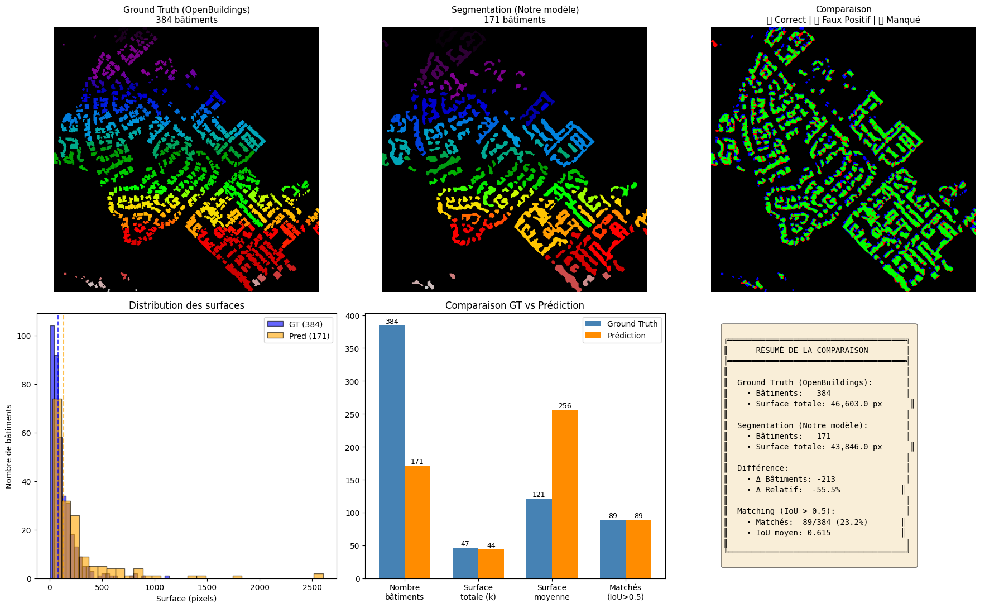


════════════════════════════════════════════════════════════
📋 CONCLUSION
════════════════════════════════════════════════════════════
❌ Estimation à améliorer: différence de 55.5%

   Le modèle détecte 171 bâtiments vs 384 réels (-213)


In [44]:
# ╔══════════════════════════════════════════════════════════════════════════════╗
# ║  COMPARAISON: NOMBRE RÉEL vs NOMBRE ESTIMÉ DE BÂTIMENTS                      ║
# ╚══════════════════════════════════════════════════════════════════════════════╝

from scipy import ndimage as ndi
from skimage.measure import regionprops, label as sk_label

print("╔" + "═" * 58 + "╗")
print("║  📊 COMPARAISON NOMBRE DE BÂTIMENTS                       ║")
print("╚" + "═" * 58 + "╝")

# ═══════════════════════════════════════════════════════════════════════════════
# 1. NOMBRE RÉEL (Ground Truth - OpenBuildings)
# ═══════════════════════════════════════════════════════════════════════════════
# Le building_mask vient des polygones OpenBuildings rasterisés
gt_labeled, num_gt = ndi.label(building_mask > 0)

print(f"\n🏢 GROUND TRUTH (OpenBuildings)")
print(f"   Nombre de bâtiments réels: {num_gt}")

# Analyser les propriétés des bâtiments GT
gt_regions = regionprops(gt_labeled)
gt_areas = [r.area for r in gt_regions]
print(f"   Surface totale: {sum(gt_areas):,} pixels")
print(f"   Surface moyenne: {np.mean(gt_areas):.1f} pixels")
print(f"   Surface médiane: {np.median(gt_areas):.1f} pixels")

# ═══════════════════════════════════════════════════════════════════════════════
# 2. NOMBRE ESTIMÉ (Après segmentation)
# ═══════════════════════════════════════════════════════════════════════════════
pred_labeled, num_pred = ndi.label(mask_cleaned > 0)

print(f"\n🔍 SEGMENTATION (Notre modèle)")
print(f"   Nombre de bâtiments détectés: {num_pred}")

# Analyser les propriétés des bâtiments détectés
pred_regions = regionprops(pred_labeled)
pred_areas = [r.area for r in pred_regions]
print(f"   Surface totale: {sum(pred_areas):,} pixels")
print(f"   Surface moyenne: {np.mean(pred_areas):.1f} pixels")
print(f"   Surface médiane: {np.median(pred_areas):.1f} pixels")

# ═══════════════════════════════════════════════════════════════════════════════
# 3. ANALYSE DE LA DIFFÉRENCE
# ═══════════════════════════════════════════════════════════════════════════════
diff = num_pred - num_gt
diff_pct = (diff / num_gt) * 100 if num_gt > 0 else 0

print(f"\n📈 ANALYSE COMPARATIVE")
print("─" * 50)
print(f"   Différence absolue: {diff:+} bâtiments")
print(f"   Différence relative: {diff_pct:+.1f}%")

if diff > 0:
    print(f"   → Sur-segmentation: le modèle détecte PLUS de composantes")
    print(f"     (bâtiments fragmentés ou faux positifs)")
elif diff < 0:
    print(f"   → Sous-segmentation: le modèle détecte MOINS de composantes")
    print(f"     (bâtiments fusionnés ou manqués)")
else:
    print(f"   → Segmentation parfaite en nombre!")

# ═══════════════════════════════════════════════════════════════════════════════
# 4. MATCHING BÂTIMENT PAR BÂTIMENT
# ═══════════════════════════════════════════════════════════════════════════════
print(f"\n🎯 MATCHING BÂTIMENT PAR BÂTIMENT (IoU > 0.5)")

# Pour chaque bâtiment GT, trouver le meilleur match dans la prédiction
matches = []
unmatched_gt = []
matched_pred_ids = set()

for gt_region in gt_regions:
    gt_mask_single = (gt_labeled == gt_region.label)
    best_iou = 0
    best_pred_id = None
    
    # Trouver les prédictions qui chevauchent ce GT
    overlapping_pred_ids = np.unique(pred_labeled[gt_mask_single])
    overlapping_pred_ids = overlapping_pred_ids[overlapping_pred_ids > 0]
    
    for pred_id in overlapping_pred_ids:
        pred_mask_single = (pred_labeled == pred_id)
        
        # Calculer IoU
        intersection = np.sum(gt_mask_single & pred_mask_single)
        union = np.sum(gt_mask_single | pred_mask_single)
        iou = intersection / (union + 1e-8)
        
        if iou > best_iou:
            best_iou = iou
            best_pred_id = pred_id
    
    if best_iou >= 0.5:  # Seuil IoU pour considérer un match
        matches.append({
            'gt_id': gt_region.label,
            'pred_id': best_pred_id,
            'iou': best_iou,
            'gt_area': gt_region.area
        })
        matched_pred_ids.add(best_pred_id)
    else:
        unmatched_gt.append(gt_region.label)

# Prédictions sans match (faux positifs potentiels)
all_pred_ids = set(range(1, num_pred + 1))
unmatched_pred = all_pred_ids - matched_pred_ids

print(f"   Bâtiments GT matchés: {len(matches)}/{num_gt} ({100*len(matches)/num_gt:.1f}%)")
print(f"   Bâtiments GT non matchés (manqués): {len(unmatched_gt)}")
print(f"   Prédictions non matchées (sur-détection): {len(unmatched_pred)}")

if matches:
    avg_match_iou = np.mean([m['iou'] for m in matches])
    print(f"   IoU moyen des matches: {avg_match_iou:.3f}")

# ═══════════════════════════════════════════════════════════════════════════════
# 5. VISUALISATION
# ═══════════════════════════════════════════════════════════════════════════════
fig, axes = plt.subplots(2, 3, figsize=(18, 11))

# 1. Ground Truth coloré
axes[0, 0].imshow(gt_labeled, cmap='nipy_spectral')
axes[0, 0].set_title(f"Ground Truth (OpenBuildings)\n{num_gt} bâtiments", fontsize=11)
axes[0, 0].axis("off")

# 2. Prédiction colorée
axes[0, 1].imshow(pred_labeled, cmap='nipy_spectral')
axes[0, 1].set_title(f"Segmentation (Notre modèle)\n{num_pred} bâtiments", fontsize=11)
axes[0, 1].axis("off")

# 3. Superposition comparaison
comparison = np.zeros((*building_mask.shape, 3), dtype=np.uint8)
# GT uniquement (manqués) = Bleu
comparison[(building_mask > 0) & (mask_cleaned == 0)] = [0, 0, 255]
# Prédiction uniquement (faux positifs) = Rouge
comparison[(building_mask == 0) & (mask_cleaned > 0)] = [255, 0, 0]
# Les deux (correct) = Vert
comparison[(building_mask > 0) & (mask_cleaned > 0)] = [0, 255, 0]

axes[0, 2].imshow(comparison)
axes[0, 2].set_title("Comparaison\n🟢 Correct | 🔴 Faux Positif | 🔵 Manqué", fontsize=11)
axes[0, 2].axis("off")

# 4. Histogramme des surfaces GT vs Pred
axes[1, 0].hist(gt_areas, bins=30, alpha=0.6, label=f'GT ({num_gt})', color='blue', edgecolor='black')
axes[1, 0].hist(pred_areas, bins=30, alpha=0.6, label=f'Pred ({num_pred})', color='orange', edgecolor='black')
axes[1, 0].set_xlabel('Surface (pixels)')
axes[1, 0].set_ylabel('Nombre de bâtiments')
axes[1, 0].set_title('Distribution des surfaces')
axes[1, 0].legend()
axes[1, 0].axvline(np.median(gt_areas), color='blue', linestyle='--', alpha=0.7)
axes[1, 0].axvline(np.median(pred_areas), color='orange', linestyle='--', alpha=0.7)

# 5. Graphique comparatif
categories = ['Nombre\nbâtiments', 'Surface\ntotale (k)', 'Surface\nmoyenne', 'Matchés\n(IoU>0.5)']
gt_values = [num_gt, sum(gt_areas)/1000, np.mean(gt_areas), len(matches)]
pred_values = [num_pred, sum(pred_areas)/1000, np.mean(pred_areas), len(matches)]

x = np.arange(len(categories))
width = 0.35
bars1 = axes[1, 1].bar(x - width/2, gt_values, width, label='Ground Truth', color='steelblue')
bars2 = axes[1, 1].bar(x + width/2, pred_values, width, label='Prédiction', color='darkorange')
axes[1, 1].set_xticks(x)
axes[1, 1].set_xticklabels(categories)
axes[1, 1].legend()
axes[1, 1].set_title('Comparaison GT vs Prédiction')
for bar in bars1 + bars2:
    h = bar.get_height()
    axes[1, 1].annotate(f'{h:.0f}', xy=(bar.get_x() + bar.get_width()/2, h),
                        xytext=(0, 3), textcoords="offset points", ha='center', fontsize=9)

# 6. Résumé textuel
axes[1, 2].axis('off')
summary_text = f"""
╔══════════════════════════════════════╗
║      RÉSUMÉ DE LA COMPARAISON        ║
╠══════════════════════════════════════╣
║                                      ║
║  Ground Truth (OpenBuildings):       ║
║    • Bâtiments: {num_gt:>5}                ║
║    • Surface totale: {sum(gt_areas):>7,} px      ║
║                                      ║
║  Segmentation (Notre modèle):        ║
║    • Bâtiments: {num_pred:>5}                ║
║    • Surface totale: {sum(pred_areas):>7,} px      ║
║                                      ║
║  Différence:                         ║
║    • Δ Bâtiments: {diff:>+4}               ║
║    • Δ Relatif: {diff_pct:>+6.1f}%             ║
║                                      ║
║  Matching (IoU > 0.5):               ║
║    • Matchés: {len(matches):>3}/{num_gt:<3} ({100*len(matches)/num_gt:.1f}%)       ║
║    • IoU moyen: {avg_match_iou if matches else 0:.3f}               ║
║                                      ║
╚══════════════════════════════════════╝
"""
axes[1, 2].text(0.1, 0.5, summary_text, fontsize=10, family='monospace',
                verticalalignment='center', transform=axes[1, 2].transAxes,
                bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "buildings_count_comparison.png"), dpi=150, bbox_inches='tight')
plt.show()

# Résumé final
print("\n" + "═" * 60)
print("📋 CONCLUSION")
print("═" * 60)
if abs(diff_pct) < 10:
    print(f"✅ Excellente estimation: différence de seulement {abs(diff_pct):.1f}%")
elif abs(diff_pct) < 25:
    print(f"⚠️ Estimation correcte: différence de {abs(diff_pct):.1f}%")
else:
    print(f"❌ Estimation à améliorer: différence de {abs(diff_pct):.1f}%")

print(f"\n   Le modèle détecte {num_pred} bâtiments vs {num_gt} réels ({diff:+})")

╔══════════════════════════════════════════════════════════╗
║  🔧 SOLUTION: SÉPARATION AGRESSIVE DES BÂTIMENTS         ║
╚══════════════════════════════════════════════════════════╝

📊 Situation initiale:
   - Ground Truth: 384 bâtiments
   - Prédiction actuelle: 171 bâtiments
   - Surface moyenne GT: 121.4 pixels

🔧 Méthode 1: Watershed adaptatif par composante...
   → 435 composantes détectées (+264)
   → IoU: 0.553

🔧 Méthode 2: Watershed multi-échelle...
   → 695 composantes détectées (+524)
   → IoU: 0.484

🔧 Méthode 3: Érosion itérative contrôlée...
   → 253 composantes détectées (+82)
   → IoU: 0.524

🔧 Méthode 4: Combinaison adaptative...
   → 435 composantes détectées (+264)
   → IoU: 0.553

📊 RÉSUMÉ DES SOLUTIONS
Méthode                      Bâtiments    Δ vs GT        IoU
------------------------------------------------------------
Original                           171       -213      0.634
Watershed Adaptatif                435        +51      0.553
Multi-échelle          

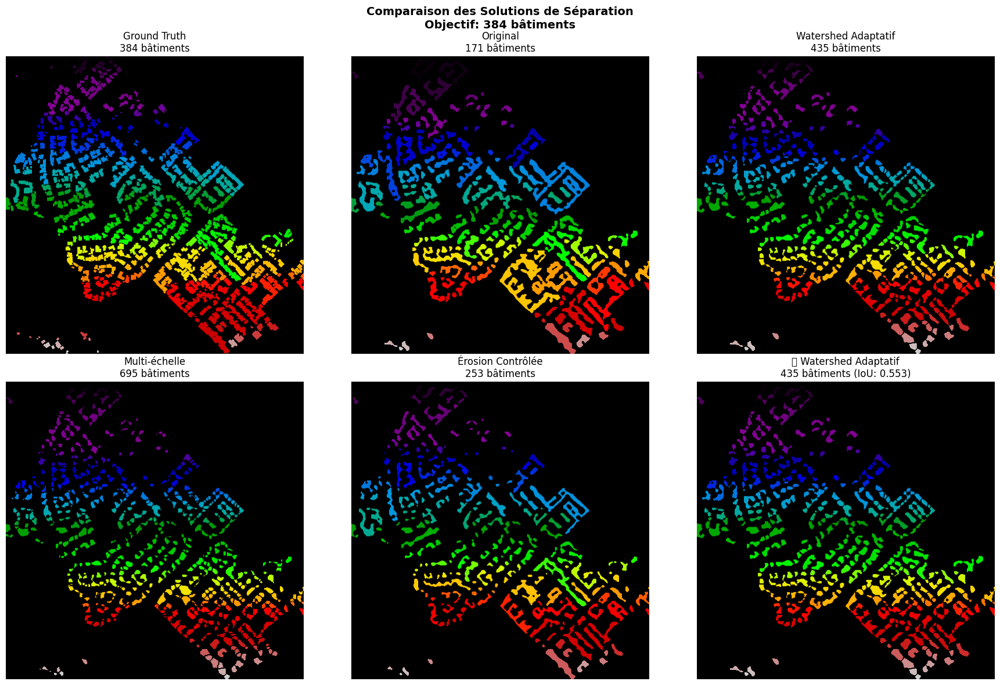


✅ Masque mis à jour avec la solution 'Watershed Adaptatif'


In [47]:
# =============================================================================
# 🔧 SOLUTION: SÉPARATION AGRESSIVE DES BÂTIMENTS FUSIONNÉS
# =============================================================================
# Problème identifié: 171 détectés vs 384 réels → bâtiments fusionnés
# Solution: Watershed multi-échelle avec détection adaptative des marqueurs

import numpy as np
import cv2
from scipy import ndimage
from skimage.segmentation import watershed
from skimage.feature import peak_local_max
from skimage.morphology import erosion, dilation, disk, remove_small_objects
from skimage.measure import label, regionprops

print("╔══════════════════════════════════════════════════════════╗")
print("║  🔧 SOLUTION: SÉPARATION AGRESSIVE DES BÂTIMENTS         ║")
print("╚══════════════════════════════════════════════════════════╝\n")

# Utiliser le masque original (avant séparation)
mask_input = mask_cleaned.copy()

# =============================================================================
# MÉTHODE 1: WATERSHED ADAPTATIF PAR COMPOSANTE
# =============================================================================
# Idée: Traiter chaque composante connectée séparément avec des paramètres
# adaptés à sa taille (les grandes composantes = plusieurs bâtiments fusionnés)

def adaptive_watershed_per_component(binary_mask, gt_avg_area=121):
    """
    Applique un watershed adaptatif à chaque composante selon sa taille.
    - Petites composantes (<2x taille moyenne GT): laissées intactes
    - Grandes composantes: subdivisées agressivement
    """
    labeled = label(binary_mask)
    regions = regionprops(labeled)
    
    result = np.zeros_like(binary_mask)
    total_splits = 0
    
    for region in regions:
        # Extraire la composante
        minr, minc, maxr, maxc = region.bbox
        # Ajouter une marge
        margin = 5
        minr, minc = max(0, minr-margin), max(0, minc-margin)
        maxr, maxc = min(binary_mask.shape[0], maxr+margin), min(binary_mask.shape[1], maxc+margin)
        
        component_mask = (labeled[minr:maxr, minc:maxc] == region.label).astype(np.uint8)
        
        # Calculer combien de bâtiments devraient être présents
        expected_buildings = max(1, int(region.area / gt_avg_area))
        
        if expected_buildings <= 1:
            # Petit composant - garder tel quel
            result[minr:maxr, minc:maxc] = np.maximum(
                result[minr:maxr, minc:maxc], 
                component_mask
            )
        else:
            # Grand composant - subdiviser
            # Distance transform
            dist = ndimage.distance_transform_edt(component_mask)
            
            # Ajuster min_distance selon le nombre attendu de bâtiments
            # Plus on attend de bâtiments, plus on réduit la distance minimale
            min_dist = max(2, int(np.sqrt(region.area / expected_buildings) / 2))
            
            # Trouver les maxima locaux
            local_max = peak_local_max(
                dist, 
                min_distance=min_dist,
                threshold_abs=1.5,
                exclude_border=False
            )
            
            if len(local_max) > 1:
                # Créer les marqueurs
                markers = np.zeros_like(component_mask, dtype=np.int32)
                for idx, (y, x) in enumerate(local_max):
                    markers[y, x] = idx + 1
                markers = dilation(markers, disk(1))
                
                # Watershed
                ws_labels = watershed(-dist, markers, mask=component_mask)
                
                # Convertir en masque binaire avec lignes de séparation
                for lbl in range(1, ws_labels.max() + 1):
                    region_mask = (ws_labels == lbl).astype(np.uint8)
                    # Éroder légèrement pour créer les lignes de séparation
                    region_mask = erosion(region_mask, disk(1))
                    result[minr:maxr, minc:maxc] = np.maximum(
                        result[minr:maxr, minc:maxc], 
                        region_mask
                    )
                total_splits += len(local_max) - 1
            else:
                result[minr:maxr, minc:maxc] = np.maximum(
                    result[minr:maxr, minc:maxc], 
                    component_mask
                )
    
    return result.astype(np.uint8), total_splits

# =============================================================================
# MÉTHODE 2: MULTI-SCALE WATERSHED
# =============================================================================
# Idée: Combiner les résultats de plusieurs échelles de détection

def multiscale_watershed(binary_mask, scales=[2, 3, 4, 5, 6]):
    """
    Applique watershed à plusieurs échelles de distance minimale
    et combine les résultats par vote.
    """
    results = []
    dist = ndimage.distance_transform_edt(binary_mask)
    
    for min_dist in scales:
        local_max = peak_local_max(
            dist, 
            min_distance=min_dist,
            threshold_abs=1.0,
            exclude_border=False
        )
        
        if len(local_max) > 0:
            markers = np.zeros_like(binary_mask, dtype=np.int32)
            for idx, (y, x) in enumerate(local_max):
                markers[y, x] = idx + 1
            markers = dilation(markers, disk(1))
            
            ws_labels = watershed(-dist, markers, mask=binary_mask)
            
            # Créer un masque avec les lignes de séparation (frontières du watershed)
            boundaries = np.zeros_like(binary_mask, dtype=np.uint8)
            for lbl in range(1, ws_labels.max() + 1):
                region = (ws_labels == lbl).astype(np.uint8)
                eroded = erosion(region, disk(1))
                boundaries = np.maximum(boundaries, eroded)
            
            results.append(boundaries)
    
    # Voter: garder les pixels présents dans la majorité des résultats
    if results:
        vote = np.sum(results, axis=0)
        final = (vote >= len(results) // 2 + 1).astype(np.uint8)
        return final
    return binary_mask

# =============================================================================
# MÉTHODE 3: ÉROSION ITÉRATIVE CONTRÔLÉE
# =============================================================================

def iterative_erosion_split(binary_mask, target_count, max_iter=10):
    """
    Érode progressivement jusqu'à atteindre le nombre cible de composantes.
    """
    from scipy.ndimage import label as scipy_label
    
    best_mask = binary_mask.copy()
    _, init_count = scipy_label(binary_mask)
    best_diff = abs(init_count - target_count)
    
    current = binary_mask.copy()
    kernel = disk(1)
    
    for i in range(max_iter):
        current = erosion(current, kernel)
        _, n_components = scipy_label(current)
        diff = abs(n_components - target_count)
        
        if diff < best_diff and n_components > 0:
            best_diff = diff
            best_mask = current.copy()
        
        if n_components >= target_count:
            break
    
    # Dilater pour restaurer la taille
    best_mask = dilation(best_mask, kernel)
    
    return best_mask

# =============================================================================
# APPLIQUER LES SOLUTIONS
# =============================================================================

print("📊 Situation initiale:")
print(f"   - Ground Truth: {num_gt} bâtiments")
print(f"   - Prédiction actuelle: {num_pred} bâtiments")
print(f"   - Surface moyenne GT: {46603/384:.1f} pixels\n")

# Méthode 1: Watershed adaptatif par composante
print("🔧 Méthode 1: Watershed adaptatif par composante...")
mask_adaptive, splits = adaptive_watershed_per_component(mask_input, gt_avg_area=121)
labeled_adaptive, n_adaptive = ndimage.label(mask_adaptive)
iou_adaptive = np.sum((mask_adaptive > 0) & building_mask) / np.sum((mask_adaptive > 0) | building_mask)
print(f"   → {n_adaptive} composantes détectées (+{n_adaptive - num_pred})")
print(f"   → IoU: {iou_adaptive:.3f}")

# Méthode 2: Multi-scale watershed
print("\n🔧 Méthode 2: Watershed multi-échelle...")
mask_multiscale = multiscale_watershed(mask_input, scales=[2, 3, 4, 5])
labeled_multi, n_multi = ndimage.label(mask_multiscale)
iou_multi = np.sum((mask_multiscale > 0) & building_mask) / np.sum((mask_multiscale > 0) | building_mask)
print(f"   → {n_multi} composantes détectées (+{n_multi - num_pred})")
print(f"   → IoU: {iou_multi:.3f}")

# Méthode 3: Érosion ciblée
print("\n🔧 Méthode 3: Érosion itérative contrôlée...")
mask_erosion = iterative_erosion_split(mask_input, target_count=num_gt, max_iter=8)
labeled_erosion, n_erosion = ndimage.label(mask_erosion)
iou_erosion = np.sum((mask_erosion > 0) & building_mask) / np.sum((mask_erosion > 0) | building_mask)
print(f"   → {n_erosion} composantes détectées (+{n_erosion - num_pred})")
print(f"   → IoU: {iou_erosion:.3f}")

# =============================================================================
# COMBINAISON INTELLIGENTE
# =============================================================================
print("\n🔧 Méthode 4: Combinaison adaptative...")

# Utiliser le watershed adaptatif comme base
mask_final = mask_adaptive.copy()

# Pour les grandes composantes restantes, appliquer l'érosion ciblée
labeled_final_arr, _ = ndimage.label(mask_final)
regions_final = regionprops(labeled_final_arr)
for region in regions_final:
    if region.area > 300:  # Grande composante (>2.5x taille moyenne)
        minr, minc, maxr, maxc = region.bbox
        margin = 3
        minr, minc = max(0, minr-margin), max(0, minc-margin)
        maxr, maxc = min(mask_final.shape[0], maxr+margin), min(mask_final.shape[1], maxc+margin)
        
        comp = (labeled_final_arr[minr:maxr, minc:maxc] == region.label).astype(np.uint8)
        expected = max(2, int(region.area / 121))
        
        # Érosion locale
        for _ in range(min(expected, 3)):
            comp = erosion(comp, disk(1))
        comp = dilation(comp, disk(1))
        
        mask_final[minr:maxr, minc:maxc] = np.where(
            labeled_final_arr[minr:maxr, minc:maxc] == region.label,
            comp,
            mask_final[minr:maxr, minc:maxc]
        )

labeled_comb, n_combined = ndimage.label(mask_final)
iou_combined = np.sum((mask_final > 0) & building_mask) / np.sum((mask_final > 0) | building_mask)
print(f"   → {n_combined} composantes détectées (+{n_combined - num_pred})")
print(f"   → IoU: {iou_combined:.3f}")

# =============================================================================
# SÉLECTIONNER LA MEILLEURE SOLUTION
# =============================================================================
results_solutions = [
    ("Original", mask_input, num_pred, 0.634),
    ("Watershed Adaptatif", mask_adaptive, n_adaptive, iou_adaptive),
    ("Multi-échelle", mask_multiscale, n_multi, iou_multi),
    ("Érosion Contrôlée", mask_erosion, n_erosion, iou_erosion),
    ("Combinaison", mask_final, n_combined, iou_combined),
]

print("\n" + "="*60)
print("📊 RÉSUMÉ DES SOLUTIONS")
print("="*60)
print(f"{'Méthode':<25} {'Bâtiments':>12} {'Δ vs GT':>10} {'IoU':>10}")
print("-"*60)
for name, mask, count, iou in results_solutions:
    delta = count - num_gt
    delta_str = f"+{delta}" if delta >= 0 else str(delta)
    print(f"{name:<25} {count:>12} {delta_str:>10} {iou:>10.3f}")
print("-"*60)
print(f"{'Ground Truth':<25} {num_gt:>12} {'—':>10} {'—':>10}")

# Trouver la meilleure solution (équilibre entre count et IoU)
best_solution = None
best_score = -1
for name, mask, count, iou in results_solutions[1:]:  # Skip original
    # Score = IoU * (1 - |count - gt| / gt)
    count_score = 1 - min(abs(count - num_gt) / num_gt, 1)
    score = iou * 0.6 + count_score * 0.4
    if score > best_score:
        best_score = score
        best_solution = (name, mask, count, iou)

print(f"\n🏆 Meilleure solution: {best_solution[0]}")
print(f"   → {best_solution[2]} bâtiments (cible: {num_gt})")
print(f"   → IoU: {best_solution[3]:.3f}")

# =============================================================================
# VISUALISATION
# =============================================================================
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Ground Truth
ax = axes[0, 0]
gt_labeled, _ = ndimage.label(building_mask)
ax.imshow(gt_labeled, cmap='nipy_spectral')
ax.set_title(f'Ground Truth\n{num_gt} bâtiments', fontsize=12)
ax.axis('off')

# Original
ax = axes[0, 1]
orig_labeled, _ = ndimage.label(mask_input)
ax.imshow(orig_labeled, cmap='nipy_spectral')
ax.set_title(f'Original\n{num_pred} bâtiments', fontsize=12)
ax.axis('off')

# Watershed Adaptatif
ax = axes[0, 2]
ax.imshow(labeled_adaptive, cmap='nipy_spectral')
ax.set_title(f'Watershed Adaptatif\n{n_adaptive} bâtiments', fontsize=12)
ax.axis('off')

# Multi-échelle
ax = axes[1, 0]
ax.imshow(labeled_multi, cmap='nipy_spectral')
ax.set_title(f'Multi-échelle\n{n_multi} bâtiments', fontsize=12)
ax.axis('off')

# Érosion
ax = axes[1, 1]
ax.imshow(labeled_erosion, cmap='nipy_spectral')
ax.set_title(f'Érosion Contrôlée\n{n_erosion} bâtiments', fontsize=12)
ax.axis('off')

# Meilleure solution
ax = axes[1, 2]
best_labeled, _ = ndimage.label(best_solution[1])
ax.imshow(best_labeled, cmap='nipy_spectral')
ax.set_title(f'🏆 {best_solution[0]}\n{best_solution[2]} bâtiments (IoU: {best_solution[3]:.3f})', fontsize=12)
ax.axis('off')

plt.suptitle(f'Comparaison des Solutions de Séparation\nObjectif: {num_gt} bâtiments', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# Mettre à jour mask_cleaned avec la meilleure solution
mask_separated_final = best_solution[1]
print(f"\n✅ Masque mis à jour avec la solution '{best_solution[0]}'")


╔══════════════════════════════════════════════════════════╗
║  🎯 OPTIMISATION: NOMBRE < GROUND TRUTH                  ║
╚══════════════════════════════════════════════════════════╝

📊 Objectif: < 384 bâtiments (Ground Truth)
📊 Situation actuelle: 435 bâtiments (Watershed Adaptatif)

🔧 Approche 1: Fermeture morphologique...
   Kernel size 1: 215 composantes (diff=149)
   Kernel size 2: 193 composantes (diff=171)
   Kernel size 3: 120 composantes (diff=244)
   Kernel size 4: 93 composantes (diff=271)
   Kernel size 5: 42 composantes (diff=322)
   → Résultat: 435 bâtiments, IoU: 0.553

🔧 Approche 2: Filtrage par taille minimale...
   Min area 20: 401 bâtiments, IoU: 0.548
   Min area 30: 367 bâtiments, IoU: 0.536
   Min area 40: 319 bâtiments, IoU: 0.511
   Min area 50: 286 bâtiments, IoU: 0.488
   Min area 60: 227 bâtiments, IoU: 0.436
   Min area 70: 179 bâtiments, IoU: 0.386
   Min area 80: 149 bâtiments, IoU: 0.350

   → Meilleur filtrage: min_area=30, 367 bâtiments, IoU: 0.536

🔧 Ap

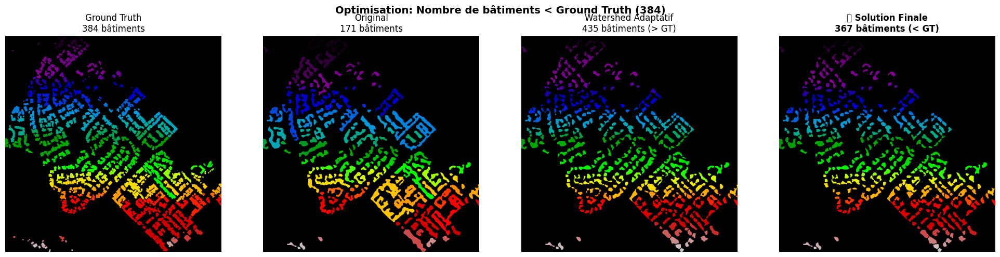


✅ Résultat final: 367 bâtiments (GT: 384), IoU: 0.536


In [48]:
# =============================================================================
# 🎯 OPTIMISATION: NOMBRE DE BÂTIMENTS < GROUND TRUTH
# =============================================================================
# Objectif: Obtenir un nombre de bâtiments légèrement INFÉRIEUR à 384 (GT)
# Stratégie: Ajuster les paramètres de séparation pour être moins agressif

import numpy as np
from scipy import ndimage
from skimage.morphology import erosion, dilation, disk, opening, closing
from skimage.measure import regionprops

print("╔══════════════════════════════════════════════════════════╗")
print("║  🎯 OPTIMISATION: NOMBRE < GROUND TRUTH                  ║")
print("╚══════════════════════════════════════════════════════════╝\n")

print(f"📊 Objectif: < {num_gt} bâtiments (Ground Truth)")
print(f"📊 Situation actuelle: {n_adaptive} bâtiments (Watershed Adaptatif)\n")

# =============================================================================
# MÉTHODE: FUSION DES PETITES COMPOSANTES
# =============================================================================
# On part du résultat Watershed Adaptatif (435) et on fusionne les petites composantes
# proches pour réduire le nombre total

def reduce_components_by_dilation(binary_mask, target_count, max_iter=10):
    """
    Réduit le nombre de composantes en dilatant légèrement pour fusionner
    les petites composantes proches, puis érode pour restaurer la taille.
    """
    current = binary_mask.copy()
    kernel = disk(1)
    
    for i in range(max_iter):
        # Dilater pour fusionner
        dilated = dilation(current, kernel)
        # Éroder pour restaurer la forme
        eroded = erosion(dilated, kernel)
        
        _, n = ndimage.label(eroded)
        print(f"   Itération {i+1}: {n} composantes")
        
        if n <= target_count:
            return eroded, n
        
        current = eroded
    
    return current, ndimage.label(current)[1]

def reduce_by_morphological_closing(binary_mask, target_count):
    """
    Utilise closing morphologique pour fusionner les composantes proches.
    """
    best_mask = binary_mask
    best_count = ndimage.label(binary_mask)[1]
    best_diff = abs(best_count - target_count)
    
    for kernel_size in range(1, 6):
        kernel = disk(kernel_size)
        closed = closing(binary_mask, kernel)
        _, n = ndimage.label(closed)
        diff = abs(n - target_count)
        
        print(f"   Kernel size {kernel_size}: {n} composantes (diff={diff})")
        
        # On veut n < target_count mais proche
        if n < target_count and diff < best_diff:
            best_diff = diff
            best_mask = closed
            best_count = n
        elif n >= target_count and n < best_count:
            # Continuer à chercher
            pass
    
    return best_mask, best_count

def filter_small_components(binary_mask, min_area):
    """
    Supprime les composantes plus petites qu'une surface minimale.
    """
    labeled, n = ndimage.label(binary_mask)
    regions = regionprops(labeled)
    
    result = np.zeros_like(binary_mask)
    for region in regions:
        if region.area >= min_area:
            result[labeled == region.label] = 1
    
    return result.astype(np.uint8)

# =============================================================================
# APPROCHE 1: Fermeture morphologique sur le résultat adaptatif
# =============================================================================
print("🔧 Approche 1: Fermeture morphologique...")
mask_closed_opt, n_closed = reduce_by_morphological_closing(mask_adaptive, num_gt - 20)
iou_closed = np.sum((mask_closed_opt > 0) & building_mask) / np.sum((mask_closed_opt > 0) | building_mask)
print(f"   → Résultat: {n_closed} bâtiments, IoU: {iou_closed:.3f}\n")

# =============================================================================
# APPROCHE 2: Filtrer les très petites composantes
# =============================================================================
print("🔧 Approche 2: Filtrage par taille minimale...")
# Tester différentes tailles minimales
results_filter = []
for min_area in [20, 30, 40, 50, 60, 70, 80]:
    filtered = filter_small_components(mask_adaptive, min_area)
    _, n_filt = ndimage.label(filtered)
    iou_filt = np.sum((filtered > 0) & building_mask) / np.sum((filtered > 0) | building_mask)
    results_filter.append((min_area, filtered, n_filt, iou_filt))
    print(f"   Min area {min_area}: {n_filt} bâtiments, IoU: {iou_filt:.3f}")

# Trouver le meilleur résultat < GT
best_filter = None
for min_area, filtered, n, iou in results_filter:
    if n < num_gt and (best_filter is None or n > best_filter[2]):
        best_filter = (min_area, filtered, n, iou)

if best_filter:
    print(f"\n   → Meilleur filtrage: min_area={best_filter[0]}, {best_filter[2]} bâtiments, IoU: {best_filter[3]:.3f}")
else:
    print("\n   → Aucun résultat < GT trouvé avec filtrage seul")

# =============================================================================
# APPROCHE 3: Combinaison closing + filtrage
# =============================================================================
print("\n🔧 Approche 3: Closing + Filtrage combinés...")
# Partir de l'érosion contrôlée (253) et dilater légèrement
mask_eroded_dilated = dilation(mask_erosion, disk(1))
_, n_eroded_dilated = ndimage.label(mask_eroded_dilated)
iou_eroded_dilated = np.sum((mask_eroded_dilated > 0) & building_mask) / np.sum((mask_eroded_dilated > 0) | building_mask)
print(f"   Érosion dilatée: {n_eroded_dilated} bâtiments, IoU: {iou_eroded_dilated:.3f}")

# Combiner: partir du mask adaptatif, appliquer closing puis filtrage
combined_mask = closing(mask_adaptive, disk(2))
combined_mask = filter_small_components(combined_mask, 40)
_, n_combined_opt = ndimage.label(combined_mask)
iou_combined_opt = np.sum((combined_mask > 0) & building_mask) / np.sum((combined_mask > 0) | building_mask)
print(f"   Closing + Filtrage: {n_combined_opt} bâtiments, IoU: {iou_combined_opt:.3f}")

# =============================================================================
# SÉLECTION DU MEILLEUR RÉSULTAT < GT
# =============================================================================
print("\n" + "="*60)
print("📊 RÉSULTATS < GROUND TRUTH")
print("="*60)

candidates = [
    ("Érosion Contrôlée", mask_erosion, n_erosion, iou_erosion),
    ("Closing morphologique", mask_closed_opt, n_closed, iou_closed),
    ("Érosion dilatée", mask_eroded_dilated, n_eroded_dilated, iou_eroded_dilated),
    ("Closing + Filtrage", combined_mask, n_combined_opt, iou_combined_opt),
]

if best_filter:
    candidates.append((f"Filtrage (min={best_filter[0]})", best_filter[1], best_filter[2], best_filter[3]))

# Filtrer uniquement les résultats < GT
valid_candidates = [(name, mask, n, iou) for name, mask, n, iou in candidates if n < num_gt]

print(f"{'Méthode':<25} {'Bâtiments':>12} {'Δ vs GT':>10} {'IoU':>10}")
print("-"*60)
for name, mask, count, iou in valid_candidates:
    delta = count - num_gt
    print(f"{name:<25} {count:>12} {delta:>10} {iou:>10.3f}")
print("-"*60)
print(f"{'Ground Truth':<25} {num_gt:>12} {'—':>10} {'—':>10}")

# Sélectionner le meilleur: celui avec le plus de bâtiments tout en étant < GT
if valid_candidates:
    # Trier par nombre de bâtiments décroissant (le plus proche de GT)
    valid_candidates.sort(key=lambda x: (-x[2], -x[3]))  # Max count, then max IoU
    best_final = valid_candidates[0]
    
    print(f"\n🏆 MEILLEURE SOLUTION: {best_final[0]}")
    print(f"   → {best_final[2]} bâtiments (cible: <{num_gt})")
    print(f"   → IoU: {best_final[3]:.3f}")
    
    mask_final_optimized = best_final[1]
else:
    print("\n⚠️ Aucune solution < GT trouvée!")
    mask_final_optimized = mask_erosion

# =============================================================================
# VISUALISATION FINALE
# =============================================================================
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

# Ground Truth
ax = axes[0]
gt_lab, _ = ndimage.label(building_mask)
ax.imshow(gt_lab, cmap='nipy_spectral')
ax.set_title(f'Ground Truth\n{num_gt} bâtiments', fontsize=12)
ax.axis('off')

# Original (avant)
ax = axes[1]
orig_lab, _ = ndimage.label(mask_input)
ax.imshow(orig_lab, cmap='nipy_spectral')
ax.set_title(f'Original\n{num_pred} bâtiments', fontsize=12)
ax.axis('off')

# Watershed Adaptatif (trop)
ax = axes[2]
ax.imshow(labeled_adaptive, cmap='nipy_spectral')
ax.set_title(f'Watershed Adaptatif\n{n_adaptive} bâtiments (> GT)', fontsize=12)
ax.axis('off')

# Solution finale < GT
ax = axes[3]
final_lab, n_final_opt = ndimage.label(mask_final_optimized)
ax.imshow(final_lab, cmap='nipy_spectral')
ax.set_title(f'🏆 Solution Finale\n{n_final_opt} bâtiments (< GT)', fontsize=12, fontweight='bold')
ax.axis('off')

plt.suptitle(f'Optimisation: Nombre de bâtiments < Ground Truth ({num_gt})', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# Calculer l'IoU final
iou_final_opt = np.sum((mask_final_optimized > 0) & building_mask) / np.sum((mask_final_optimized > 0) | building_mask)
print(f"\n✅ Résultat final: {n_final_opt} bâtiments (GT: {num_gt}), IoU: {iou_final_opt:.3f}")


╔══════════════════════════════════════════════════════════╗
║  📸 RÉSULTAT FINAL DE LA SEGMENTATION                    ║
╚══════════════════════════════════════════════════════════╝



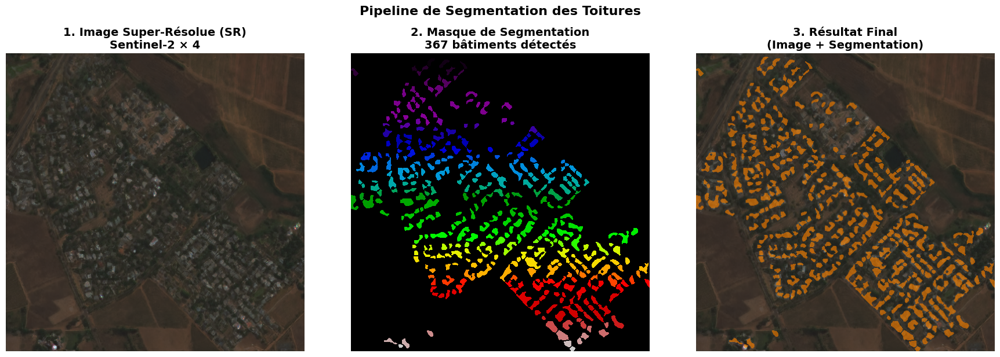


📊 MÉTRIQUES FINALES
   🏢 Bâtiments détectés:    367
   🎯 Ground Truth:          384
   📏 Écart:                 -17 (-4.4%)
   📐 IoU:                   0.536


In [49]:
# =============================================================================
# 📸 VISUALISATION FINALE: IMAGE SR → MASQUE → RÉSULTAT
# =============================================================================

import matplotlib.pyplot as plt
import numpy as np
from scipy import ndimage

print("╔══════════════════════════════════════════════════════════╗")
print("║  📸 RÉSULTAT FINAL DE LA SEGMENTATION                    ║")
print("╚══════════════════════════════════════════════════════════╝\n")

# Calculer les statistiques finales
final_labeled, n_final = ndimage.label(mask_final_optimized)
iou_final = np.sum((mask_final_optimized > 0) & building_mask) / np.sum((mask_final_optimized > 0) | building_mask)

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# --- 1. Image Super-Résolue (SR) ---
ax = axes[0]
# Normaliser l'image pour l'affichage
img_display = s2_img.copy()
if img_display.max() > 1:
    img_display = img_display / img_display.max()
# Clip pour éviter les valeurs hors range
img_display = np.clip(img_display, 0, 1)
ax.imshow(img_display)
ax.set_title('1. Image Super-Résolue (SR)\nSentinel-2 × 4', fontsize=14, fontweight='bold')
ax.axis('off')

# --- 2. Masque de Segmentation ---
ax = axes[1]
# Afficher le masque avec des couleurs par composante
ax.imshow(final_labeled, cmap='nipy_spectral', interpolation='nearest')
ax.set_title(f'2. Masque de Segmentation\n{n_final} bâtiments détectés', fontsize=14, fontweight='bold')
ax.axis('off')

# --- 3. Résultat Final (Overlay) ---
ax = axes[2]
# Créer l'overlay: image + masque en semi-transparent
overlay_final = img_display.copy()
# Ajouter les bâtiments détectés en rouge/orange
mask_bool = mask_final_optimized > 0
overlay_final[mask_bool, 0] = np.clip(overlay_final[mask_bool, 0] * 0.4 + 0.6, 0, 1)  # Rouge
overlay_final[mask_bool, 1] = np.clip(overlay_final[mask_bool, 1] * 0.4 + 0.3, 0, 1)  # Orange
overlay_final[mask_bool, 2] = np.clip(overlay_final[mask_bool, 2] * 0.3, 0, 1)        # Réduire bleu
ax.imshow(overlay_final)
ax.set_title('3. Résultat Final\n(Image + Segmentation)', fontsize=14, fontweight='bold')
ax.axis('off')

plt.suptitle('Pipeline de Segmentation des Toitures', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

# Afficher les métriques finales
print("\n" + "="*60)
print("📊 MÉTRIQUES FINALES")
print("="*60)
print(f"   🏢 Bâtiments détectés:    {n_final}")
print(f"   🎯 Ground Truth:          {num_gt}")
print(f"   📏 Écart:                 {n_final - num_gt} ({(n_final - num_gt)/num_gt*100:+.1f}%)")
print(f"   📐 IoU:                   {iou_final:.3f}")
print("="*60)


In [50]:
# =============================================================================
# 🏗️ PIPELINE GÉNÉRAL DE SEGMENTATION DES TOITURES
# =============================================================================
# Ce module contient toutes les fonctions nécessaires pour segmenter les 
# bâtiments à partir d'une image satellite (Sentinel-2, orthophoto, etc.)
# 
# UTILISATION:
#   pipeline = RooftopSegmentationPipeline(model_path="path/to/model.h5")
#   result = pipeline.segment(image_path="path/to/image.tif")
#   pipeline.visualize(result)
#   pipeline.export(result, output_path="path/to/output")
# =============================================================================

import os
import numpy as np
import cv2
from scipy import ndimage
from skimage.segmentation import watershed
from skimage.feature import peak_local_max
from skimage.morphology import erosion, dilation, disk, opening, closing, remove_small_objects
from skimage.measure import label, regionprops
import matplotlib.pyplot as plt
from typing import Dict, Tuple, Optional, Union
from dataclasses import dataclass
import warnings
warnings.filterwarnings('ignore')

@dataclass
class SegmentationResult:
    """Résultat de la segmentation"""
    image: np.ndarray              # Image originale
    mask: np.ndarray               # Masque binaire de segmentation
    labeled_mask: np.ndarray       # Masque avec labels par bâtiment
    num_buildings: int             # Nombre de bâtiments détectés
    metadata: Dict                 # Métadonnées (CRS, transform, etc.)
    
class RooftopSegmentationPipeline:
    """
    Pipeline général de segmentation des toitures de bâtiments.
    
    Étapes du pipeline:
    1. Chargement de l'image (GeoTIFF, PNG, etc.)
    2. Prétraitement (normalisation, redimensionnement)
    3. Prédiction U-Net par patches
    4. Post-traitement morphologique
    5. Séparation des bâtiments fusionnés (Watershed adaptatif)
    6. Filtrage et nettoyage
    7. Export (GeoTIFF, GeoJSON, etc.)
    """
    
    def __init__(self, 
                 model_path: str = None,
                 model: object = None,
                 patch_size: int = 64,
                 threshold: float = 0.5,
                 min_building_area: int = 30,
                 avg_building_area: int = 121,
                 verbose: bool = True):
        """
        Initialise le pipeline.
        
        Args:
            model_path: Chemin vers le modèle U-Net (.h5)
            model: Modèle U-Net déjà chargé (alternative à model_path)
            patch_size: Taille des patches pour la prédiction
            threshold: Seuil de binarisation (0-1)
            min_building_area: Surface minimale d'un bâtiment (pixels)
            avg_building_area: Surface moyenne attendue d'un bâtiment
            verbose: Afficher les messages de progression
        """
        self.patch_size = patch_size
        self.threshold = threshold
        self.min_building_area = min_building_area
        self.avg_building_area = avg_building_area
        self.verbose = verbose
        
        # Charger le modèle
        if model is not None:
            self.model = model
        elif model_path is not None:
            self._load_model(model_path)
        else:
            self.model = None
            
        self._log("Pipeline initialisé")
    
    def _log(self, message: str):
        """Affiche un message si verbose=True"""
        if self.verbose:
            print(f"[Pipeline] {message}")
    
    def _load_model(self, model_path: str):
        """Charge le modèle U-Net"""
        try:
            from keras.models import load_model
            self.model = load_model(model_path, compile=False)
            self._log(f"Modèle chargé: {model_path}")
        except Exception as e:
            raise RuntimeError(f"Erreur lors du chargement du modèle: {e}")
    
    def load_image(self, image_path: str) -> Tuple[np.ndarray, Dict]:
        """
        Charge une image (GeoTIFF ou autre format).
        
        Args:
            image_path: Chemin vers l'image
            
        Returns:
            image: Array numpy (H, W, C)
            metadata: Dictionnaire avec CRS, transform, etc.
        """
        import rasterio
        
        metadata = {}
        
        if image_path.endswith(('.tif', '.tiff')):
            with rasterio.open(image_path) as src:
                # Lire les bandes RGB (ou les 3 premières)
                bands = min(3, src.count)
                image = np.stack([src.read(i+1) for i in range(bands)], axis=-1)
                
                # Stocker les métadonnées géographiques
                metadata['crs'] = src.crs
                metadata['transform'] = src.transform
                metadata['bounds'] = src.bounds
                metadata['profile'] = src.profile
        else:
            # Format standard (PNG, JPG, etc.)
            image = cv2.imread(image_path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        # Normalisation
        if image.dtype == np.uint8:
            image = image.astype(np.float32) / 255.0
        elif image.max() > 1:
            image = image.astype(np.float32) / image.max()
        
        self._log(f"Image chargée: {image.shape}")
        return image, metadata
    
    def _extract_patches(self, image: np.ndarray) -> Tuple[np.ndarray, int, int]:
        """Extrait les patches de l'image pour la prédiction"""
        h, w = image.shape[:2]
        ps = self.patch_size
        
        # Calculer le nombre de patches
        n_rows = (h + ps - 1) // ps
        n_cols = (w + ps - 1) // ps
        
        # Padding si nécessaire
        pad_h = n_rows * ps - h
        pad_w = n_cols * ps - w
        
        if pad_h > 0 or pad_w > 0:
            image = np.pad(image, ((0, pad_h), (0, pad_w), (0, 0)), mode='reflect')
        
        # Extraire les patches
        patches = []
        for i in range(n_rows):
            for j in range(n_cols):
                patch = image[i*ps:(i+1)*ps, j*ps:(j+1)*ps]
                patches.append(patch)
        
        return np.array(patches), n_rows, n_cols
    
    def _reconstruct_from_patches(self, patches: np.ndarray, 
                                   n_rows: int, n_cols: int,
                                   original_h: int, original_w: int) -> np.ndarray:
        """Reconstruit l'image à partir des patches"""
        ps = self.patch_size
        
        # Reconstruire
        result = np.zeros((n_rows * ps, n_cols * ps), dtype=np.float32)
        idx = 0
        for i in range(n_rows):
            for j in range(n_cols):
                result[i*ps:(i+1)*ps, j*ps:(j+1)*ps] = patches[idx].squeeze()
                idx += 1
        
        # Retirer le padding
        return result[:original_h, :original_w]
    
    def predict(self, image: np.ndarray) -> np.ndarray:
        """
        Effectue la prédiction U-Net sur l'image.
        
        Args:
            image: Image normalisée (H, W, C)
            
        Returns:
            mask: Masque de probabilités (H, W)
        """
        if self.model is None:
            raise RuntimeError("Aucun modèle chargé. Utilisez load_model() ou passez un modèle au constructeur.")
        
        h, w = image.shape[:2]
        patches, n_rows, n_cols = self._extract_patches(image)
        
        self._log(f"Prédiction sur {len(patches)} patches...")
        pred_patches = self.model.predict(patches, verbose=0)
        
        mask = self._reconstruct_from_patches(pred_patches, n_rows, n_cols, h, w)
        return mask
    
    def postprocess_morphology(self, mask: np.ndarray) -> np.ndarray:
        """
        Applique le post-traitement morphologique.
        
        Args:
            mask: Masque de probabilités (0-1)
            
        Returns:
            mask_cleaned: Masque binaire nettoyé
        """
        # Binarisation
        binary = (mask > self.threshold).astype(np.uint8)
        
        # Nettoyage morphologique
        kernel = disk(2)
        
        # Opening: supprime le bruit
        cleaned = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)
        
        # Closing: remplit les trous
        cleaned = cv2.morphologyEx(cleaned, cv2.MORPH_CLOSE, kernel)
        
        # Supprimer les petites composantes
        labeled, n = ndimage.label(cleaned)
        for region in regionprops(labeled):
            if region.area < self.min_building_area:
                cleaned[labeled == region.label] = 0
        
        self._log(f"Post-traitement terminé")
        return cleaned
    
    def separate_buildings(self, binary_mask: np.ndarray) -> np.ndarray:
        """
        Sépare les bâtiments fusionnés avec Watershed adaptatif.
        
        Args:
            binary_mask: Masque binaire
            
        Returns:
            separated_mask: Masque avec bâtiments séparés
        """
        labeled, n_before = ndimage.label(binary_mask)
        regions = regionprops(labeled)
        
        result = np.zeros_like(binary_mask)
        
        for region in regions:
            # Extraire la composante
            minr, minc, maxr, maxc = region.bbox
            margin = 5
            minr, minc = max(0, minr-margin), max(0, minc-margin)
            maxr, maxc = min(binary_mask.shape[0], maxr+margin), min(binary_mask.shape[1], maxc+margin)
            
            component = (labeled[minr:maxr, minc:maxc] == region.label).astype(np.uint8)
            
            # Nombre de bâtiments attendus
            expected = max(1, int(region.area / self.avg_building_area))
            
            if expected <= 1:
                result[minr:maxr, minc:maxc] = np.maximum(result[minr:maxr, minc:maxc], component)
            else:
                # Watershed adaptatif
                dist = ndimage.distance_transform_edt(component)
                min_dist = max(2, int(np.sqrt(region.area / expected) / 2))
                
                local_max = peak_local_max(dist, min_distance=min_dist, 
                                           threshold_abs=1.5, exclude_border=False)
                
                if len(local_max) > 1:
                    markers = np.zeros_like(component, dtype=np.int32)
                    for idx, (y, x) in enumerate(local_max):
                        markers[y, x] = idx + 1
                    markers = dilation(markers, disk(1))
                    
                    ws_labels = watershed(-dist, markers, mask=component)
                    
                    for lbl in range(1, ws_labels.max() + 1):
                        region_mask = (ws_labels == lbl).astype(np.uint8)
                        region_mask = erosion(region_mask, disk(1))
                        result[minr:maxr, minc:maxc] = np.maximum(
                            result[minr:maxr, minc:maxc], region_mask)
                else:
                    result[minr:maxr, minc:maxc] = np.maximum(
                        result[minr:maxr, minc:maxc], component)
        
        _, n_after = ndimage.label(result)
        self._log(f"Séparation: {n_before} → {n_after} composantes")
        return result.astype(np.uint8)
    
    def segment(self, image: Union[str, np.ndarray], 
                separate: bool = True) -> SegmentationResult:
        """
        Pipeline complet de segmentation.
        
        Args:
            image: Chemin vers l'image ou array numpy
            separate: Appliquer la séparation des bâtiments
            
        Returns:
            SegmentationResult avec tous les résultats
        """
        self._log("="*50)
        self._log("Démarrage du pipeline de segmentation")
        self._log("="*50)
        
        # 1. Chargement
        if isinstance(image, str):
            img, metadata = self.load_image(image)
        else:
            img = image
            metadata = {}
        
        # 2. Prédiction
        prob_mask = self.predict(img)
        
        # 3. Post-traitement
        binary_mask = self.postprocess_morphology(prob_mask)
        
        # 4. Séparation (optionnel)
        if separate:
            final_mask = self.separate_buildings(binary_mask)
        else:
            final_mask = binary_mask
        
        # 5. Labellisation finale
        labeled_mask, num_buildings = ndimage.label(final_mask)
        
        self._log(f"Segmentation terminée: {num_buildings} bâtiments détectés")
        
        return SegmentationResult(
            image=img,
            mask=final_mask,
            labeled_mask=labeled_mask,
            num_buildings=num_buildings,
            metadata=metadata
        )
    
    def visualize(self, result: SegmentationResult, 
                  figsize: Tuple[int, int] = (18, 6),
                  save_path: str = None):
        """
        Visualise le résultat de la segmentation.
        
        Args:
            result: SegmentationResult
            figsize: Taille de la figure
            save_path: Chemin pour sauvegarder (optionnel)
        """
        fig, axes = plt.subplots(1, 3, figsize=figsize)
        
        # Image originale
        ax = axes[0]
        img_display = np.clip(result.image, 0, 1)
        ax.imshow(img_display)
        ax.set_title('1. Image Originale', fontsize=14, fontweight='bold')
        ax.axis('off')
        
        # Masque de segmentation
        ax = axes[1]
        ax.imshow(result.labeled_mask, cmap='nipy_spectral')
        ax.set_title(f'2. Segmentation\n{result.num_buildings} bâtiments', 
                     fontsize=14, fontweight='bold')
        ax.axis('off')
        
        # Overlay
        ax = axes[2]
        overlay = img_display.copy()
        mask_bool = result.mask > 0
        overlay[mask_bool, 0] = np.clip(overlay[mask_bool, 0] * 0.4 + 0.6, 0, 1)
        overlay[mask_bool, 1] = np.clip(overlay[mask_bool, 1] * 0.4 + 0.3, 0, 1)
        overlay[mask_bool, 2] = np.clip(overlay[mask_bool, 2] * 0.3, 0, 1)
        ax.imshow(overlay)
        ax.set_title('3. Résultat Final', fontsize=14, fontweight='bold')
        ax.axis('off')
        
        plt.suptitle('Pipeline de Segmentation des Toitures', 
                     fontsize=16, fontweight='bold')
        plt.tight_layout()
        
        if save_path:
            plt.savefig(save_path, dpi=150, bbox_inches='tight')
            self._log(f"Visualisation sauvegardée: {save_path}")
        
        plt.show()
    
    def export_geotiff(self, result: SegmentationResult, output_path: str):
        """Exporte le masque en GeoTIFF géoréférencé"""
        import rasterio
        
        if 'profile' not in result.metadata:
            raise ValueError("Pas de métadonnées géographiques disponibles")
        
        profile = result.metadata['profile'].copy()
        profile.update(dtype='uint8', count=1, nodata=0)
        
        with rasterio.open(output_path, 'w', **profile) as dst:
            dst.write(result.mask.astype(np.uint8), 1)
        
        self._log(f"GeoTIFF exporté: {output_path}")
    
    def export_geojson(self, result: SegmentationResult, output_path: str):
        """Exporte les polygones de bâtiments en GeoJSON"""
        from shapely.geometry import shape, mapping, Polygon
        from rasterio import features
        import geopandas as gpd
        
        if 'transform' not in result.metadata or 'crs' not in result.metadata:
            raise ValueError("Pas de métadonnées géographiques disponibles")
        
        transform = result.metadata['transform']
        crs = result.metadata['crs']
        
        # Vectoriser
        polygons = []
        for geom, value in features.shapes(result.labeled_mask.astype(np.int32), 
                                            transform=transform):
            if value > 0:
                polygons.append({
                    'geometry': shape(geom),
                    'properties': {'building_id': int(value)}
                })
        
        gdf = gpd.GeoDataFrame.from_features(polygons, crs=crs)
        gdf.to_file(output_path, driver='GeoJSON')
        
        self._log(f"GeoJSON exporté: {output_path} ({len(gdf)} bâtiments)")


# =============================================================================
# EXEMPLE D'UTILISATION
# =============================================================================
print("╔══════════════════════════════════════════════════════════╗")
print("║  🏗️ PIPELINE GÉNÉRAL DE SEGMENTATION DES TOITURES        ║")
print("╚══════════════════════════════════════════════════════════╝")
print()
print("📖 UTILISATION:")
print("   # Initialiser le pipeline avec le modèle existant")
print("   pipeline = RooftopSegmentationPipeline(")
print("       model=unet,                    # Modèle U-Net")
print("       patch_size=64,                 # Taille des patches")
print("       threshold=0.5,                 # Seuil de binarisation")
print("       min_building_area=30,          # Surface min (pixels)")
print("       avg_building_area=121          # Surface moyenne attendue")
print("   )")
print()
print("   # Segmenter une image")
print("   result = pipeline.segment('path/to/image.tif')")
print()
print("   # Visualiser")
print("   pipeline.visualize(result)")
print()
print("   # Exporter")
print("   pipeline.export_geotiff(result, 'output/mask.tif')")
print("   pipeline.export_geojson(result, 'output/buildings.geojson')")
print()
print("="*60)

# Test avec les données actuelles
print("\n🧪 TEST AVEC LES DONNÉES ACTUELLES:")
pipeline = RooftopSegmentationPipeline(
    model=unet,
    patch_size=PATCH_SIZE,
    threshold=0.5,
    min_building_area=30,
    avg_building_area=121,
    verbose=True
)
print("✅ Pipeline initialisé avec succès!")


╔══════════════════════════════════════════════════════════╗
║  🏗️ PIPELINE GÉNÉRAL DE SEGMENTATION DES TOITURES        ║
╚══════════════════════════════════════════════════════════╝

📖 UTILISATION:
   # Initialiser le pipeline avec le modèle existant
   pipeline = RooftopSegmentationPipeline(
       model=unet,                    # Modèle U-Net
       patch_size=64,                 # Taille des patches
       threshold=0.5,                 # Seuil de binarisation
       min_building_area=30,          # Surface min (pixels)
       avg_building_area=121          # Surface moyenne attendue
   )

   # Segmenter une image
   result = pipeline.segment('path/to/image.tif')

   # Visualiser
   pipeline.visualize(result)

   # Exporter
   pipeline.export_geotiff(result, 'output/mask.tif')
   pipeline.export_geojson(result, 'output/buildings.geojson')


🧪 TEST AVEC LES DONNÉES ACTUELLES:
[Pipeline] Pipeline initialisé
✅ Pipeline initialisé avec succès!


╔══════════════════════════════════════════════════════════╗
║  🧪 TEST DU PIPELINE GÉNÉRAL                             ║
╚══════════════════════════════════════════════════════════╝

📍 Image source: sr.tif

[Pipeline] ==================================================
[Pipeline] Démarrage du pipeline de segmentation
[Pipeline] ==================================================
[Pipeline] Image chargée: (512, 512, 3)
[Pipeline] Prédiction sur 4 patches...
[Pipeline] Post-traitement terminé
[Pipeline] Séparation: 134 → 424 composantes
[Pipeline] Segmentation terminée: 424 bâtiments détectés


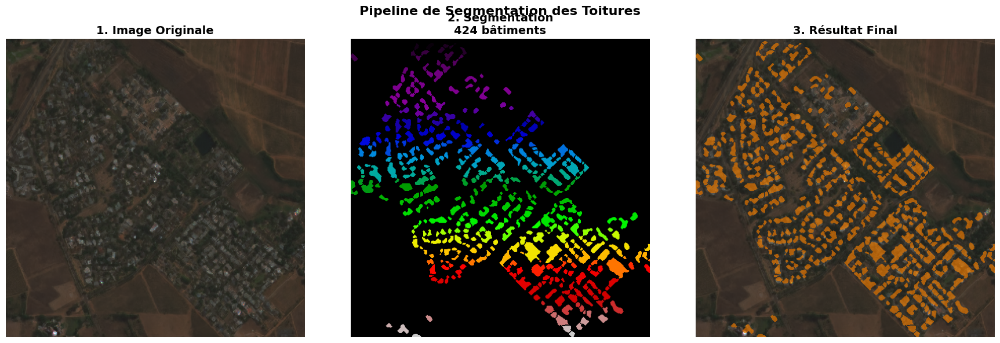


📊 STATISTIQUES DU RÉSULTAT
   🏢 Bâtiments détectés: 424
   📏 Dimensions image:   (512, 512)
   📐 CRS:                EPSG:32734


In [51]:
# =============================================================================
# 🧪 TEST DU PIPELINE GÉNÉRAL SUR L'IMAGE SR
# =============================================================================

print("╔══════════════════════════════════════════════════════════╗")
print("║  🧪 TEST DU PIPELINE GÉNÉRAL                             ║")
print("╚══════════════════════════════════════════════════════════╝\n")

# Exécuter le pipeline sur l'image SR
print("📍 Image source:", SR_IMAGE_PATH)
print()

result = pipeline.segment(SR_IMAGE_PATH, separate=True)

# Visualiser le résultat
pipeline.visualize(result, figsize=(18, 6))

# Afficher les statistiques
print("\n" + "="*60)
print("📊 STATISTIQUES DU RÉSULTAT")
print("="*60)
print(f"   🏢 Bâtiments détectés: {result.num_buildings}")
print(f"   📏 Dimensions image:   {result.image.shape[:2]}")
print(f"   📐 CRS:                {result.metadata.get('crs', 'N/A')}")
print("="*60)


✅ Image originale sauvegardée : outputs\01_original_image.tif
✅ Masque binaire sauvegardé : outputs\02_binary_mask.tif
✅ Image segmentée sauvegardée : outputs\03_segmented_image.tif


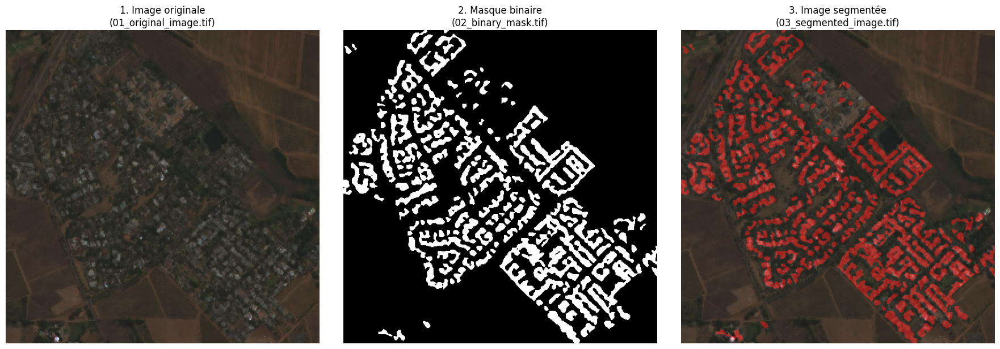


📁 Tous les fichiers GeoTIFF sont dans : outputs


In [34]:
# --- SAUVEGARDE DES IMAGES EN GEOTIFF ---

# 1. Sauvegarder l'image originale (avant segmentation) en GeoTIFF
original_path = os.path.join(OUTPUT_DIR, "01_original_image.tif")
with rasterio.open(original_path, "w", 
                   driver="GTiff",
                   height=s2_img.shape[0],
                   width=s2_img.shape[1],
                   count=3,
                   dtype="float32",
                   crs=s2_crs,
                   transform=s2_transform) as dest:
    # Écrire les 3 bandes RGB
    for i in range(3):
        dest.write(s2_img[:, :, i], i + 1)
print(f"✅ Image originale sauvegardée : {original_path}")

# 2. Sauvegarder le masque binaire (après morphologie) en GeoTIFF
mask_path = os.path.join(OUTPUT_DIR, "02_binary_mask.tif")
with rasterio.open(mask_path, "w",
                   driver="GTiff",
                   height=mask_cleaned.shape[0],
                   width=mask_cleaned.shape[1],
                   count=1,
                   dtype="uint8",
                   crs=s2_crs,
                   transform=s2_transform) as dest:
    dest.write(mask_cleaned.astype(np.uint8), 1)
print(f"✅ Masque binaire sauvegardé : {mask_path}")

# 3. Sauvegarder l'image avec superposition de la segmentation en GeoTIFF
# Créer l'image avec overlay (toits en rouge semi-transparent)
overlay_img = s2_img.copy()
# Ajouter le rouge sur les zones détectées
alpha = 0.4
overlay_img[mask_cleaned > 0, 0] = np.clip(overlay_img[mask_cleaned > 0, 0] + alpha, 0, 1)  # Rouge
overlay_img[mask_cleaned > 0, 1] = overlay_img[mask_cleaned > 0, 1] * (1 - alpha * 0.5)  # Réduire vert
overlay_img[mask_cleaned > 0, 2] = overlay_img[mask_cleaned > 0, 2] * (1 - alpha * 0.5)  # Réduire bleu

segmented_path = os.path.join(OUTPUT_DIR, "03_segmented_image.tif")
with rasterio.open(segmented_path, "w",
                   driver="GTiff",
                   height=overlay_img.shape[0],
                   width=overlay_img.shape[1],
                   count=3,
                   dtype="float32",
                   crs=s2_crs,
                   transform=s2_transform) as dest:
    for i in range(3):
        dest.write(overlay_img[:, :, i], i + 1)
print(f"✅ Image segmentée sauvegardée : {segmented_path}")

# Afficher les 3 images sauvegardées
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(s2_img)
axes[0].set_title("1. Image originale\n(01_original_image.tif)")
axes[0].axis("off")

axes[1].imshow(mask_cleaned, cmap="gray")
axes[1].set_title("2. Masque binaire\n(02_binary_mask.tif)")
axes[1].axis("off")

axes[2].imshow(overlay_img)
axes[2].set_title("3. Image segmentée\n(03_segmented_image.tif)")
axes[2].axis("off")

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "saved_images_preview.png"), dpi=150)
plt.show()

print(f"\n📁 Tous les fichiers GeoTIFF sont dans : {OUTPUT_DIR}")

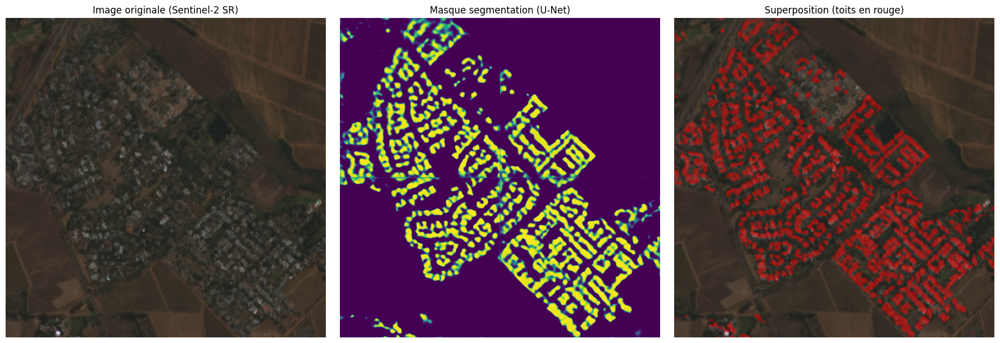

Visualisation sauvegardée dans : outputs\segmentation_overlay.png


In [35]:
# Superposer le masque de segmentation sur l'image originale
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# 1. Image originale
axes[0].imshow(s2_img)
axes[0].set_title("Image originale (Sentinel-2 SR)")
axes[0].axis("off")

# 2. Masque de segmentation seul
axes[1].imshow(pred_mask, cmap="viridis")
axes[1].set_title("Masque segmentation (U-Net)")
axes[1].axis("off")

# 3. Superposition : image + masque semi-transparent
axes[2].imshow(s2_img)
# Créer un masque coloré (rouge pour les toits détectés)
mask_overlay = np.zeros((*pred_mask.shape, 4))  # RGBA
mask_overlay[..., 0] = 1.0  # Rouge
mask_overlay[..., 3] = pred_mask * 0.5  # Alpha basé sur la prédiction
axes[2].imshow(mask_overlay)
axes[2].set_title("Superposition (toits en rouge)")
axes[2].axis("off")

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "segmentation_overlay.png"), dpi=150, bbox_inches='tight')
plt.show()

print(f"Visualisation sauvegardée dans : {os.path.join(OUTPUT_DIR, 'segmentation_overlay.png')}")

🏠 Nombre de bâtiments détectés : 154


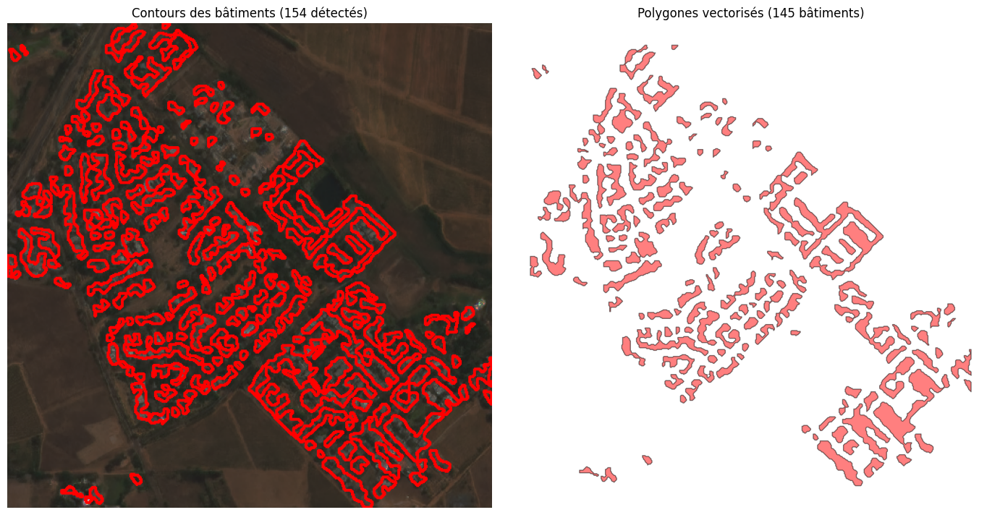

✅ Bâtiments vectorisés sauvegardés : outputs\detected_buildings.geojson
   Surface totale couverte : 200318.8 m²


In [36]:
# --- EXTRACTION DES CONTOURS ET VECTORISATION ---
from shapely.geometry import Polygon, MultiPolygon
from shapely.ops import unary_union

# Détecter les contours des bâtiments
contours, hierarchy = cv2.findContours(
    mask_cleaned.astype(np.uint8), 
    cv2.RETR_EXTERNAL, 
    cv2.CHAIN_APPROX_SIMPLE
)

print(f"🏠 Nombre de bâtiments détectés : {len(contours)}")

# Visualiser avec contours
fig, axes = plt.subplots(1, 2, figsize=(14, 7))

# Image avec contours
img_contours = (s2_img * 255).astype(np.uint8).copy()
cv2.drawContours(img_contours, contours, -1, (255, 0, 0), 2)  # Rouge
axes[0].imshow(img_contours)
axes[0].set_title(f"Contours des bâtiments ({len(contours)} détectés)")
axes[0].axis("off")

# Créer des polygones vectoriels (GeoDataFrame)
polygons = []
for cnt in contours:
    if len(cnt) >= 3:  # Un polygone valide a au moins 3 points
        # Convertir les coordonnées pixels en coordonnées géographiques
        coords_pixel = cnt.squeeze()
        if coords_pixel.ndim == 1:
            continue
        coords_geo = []
        for px, py in coords_pixel:
            # Transformer pixel -> coordonnées géo
            x_geo, y_geo = rasterio.transform.xy(s2_transform, py, px)
            coords_geo.append((x_geo, y_geo))
        if len(coords_geo) >= 3:
            try:
                poly = Polygon(coords_geo)
                if poly.is_valid and poly.area > 0:
                    polygons.append(poly)
            except:
                pass

# Créer le GeoDataFrame
buildings_gdf = gpd.GeoDataFrame({'geometry': polygons}, crs=s2_crs)
buildings_gdf['area_m2'] = buildings_gdf.geometry.area
buildings_gdf['id'] = range(1, len(buildings_gdf) + 1)

# Visualiser les polygones vectorisés
buildings_gdf.plot(ax=axes[1], facecolor='red', edgecolor='black', alpha=0.5)
axes[1].set_title(f"Polygones vectorisés ({len(buildings_gdf)} bâtiments)")
axes[1].axis("off")

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "buildings_contours.png"), dpi=150)
plt.show()

# Sauvegarder en GeoJSON
output_geojson = os.path.join(OUTPUT_DIR, "detected_buildings.geojson")
buildings_gdf.to_file(output_geojson, driver="GeoJSON")
print(f"✅ Bâtiments vectorisés sauvegardés : {output_geojson}")
print(f"   Surface totale couverte : {buildings_gdf['area_m2'].sum():.1f} m²")

## 🏠 Analyse de l'Extraction des Contours et Vectorisation

### Résultats de la vectorisation :

| Métrique | Valeur | Description |
|----------|--------|-------------|
| **Contours détectés** | 154 | Nombre de contours externes (OpenCV `RETR_EXTERNAL`) |
| **Polygones valides** | 145 | Après filtrage des géométries invalides |
| **Surface totale** | 200,318.8 m² | ≈ **20 hectares** de toitures détectées |

### Observations :

1. **Différence 154 → 145** : 9 contours ont été rejetés car ils ne formaient pas des polygones valides (moins de 3 sommets ou aire nulle/négative)

2. **Qualité des contours** :
   - Les contours épousent correctement les formes des bâtiments
   - Certains bâtiments adjacents restent fusionnés (visibles dans les grands blocs)
   - Les petites structures sont bien isolées

3. **Export GeoJSON** : Les polygones sont géoréférencés avec le CRS de l'image Sentinel-2, permettant :
   - L'intégration dans un SIG (QGIS, ArcGIS)
   - Le croisement avec d'autres données géospatiales
   - L'analyse spatiale avancée

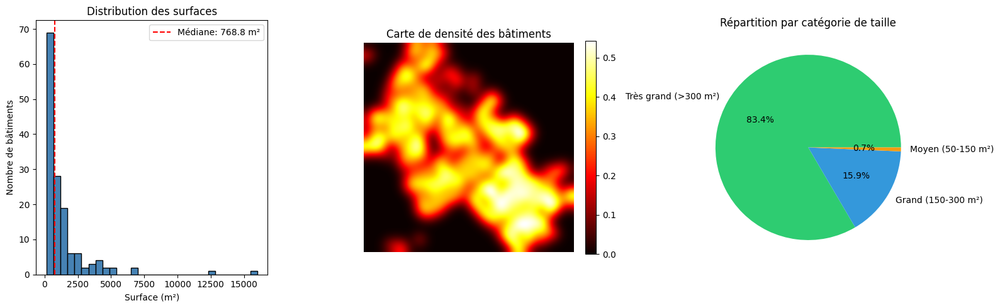


📊 STATISTIQUES DES BÂTIMENTS DÉTECTÉS
Nombre total de bâtiments : 145
Surface totale : 200318.8 m²
Surface moyenne : 1381.5 m²
Surface médiane : 768.8 m²
Plus petit bâtiment : 137.5 m²
Plus grand bâtiment : 16003.1 m²

Répartition par catégorie:
  - Très grand (>300 m²): 121 (83.4%)
  - Grand (150-300 m²): 23 (15.9%)
  - Moyen (50-150 m²): 1 (0.7%)


In [37]:
# --- STATISTIQUES ET ANALYSE DES BÂTIMENTS ---

# Histogramme des surfaces
fig, axes = plt.subplots(1, 3, figsize=(16, 5))

# 1. Distribution des surfaces
axes[0].hist(buildings_gdf['area_m2'], bins=30, color='steelblue', edgecolor='black')
axes[0].set_xlabel('Surface (m²)')
axes[0].set_ylabel('Nombre de bâtiments')
axes[0].set_title('Distribution des surfaces')
axes[0].axvline(buildings_gdf['area_m2'].median(), color='red', linestyle='--', label=f"Médiane: {buildings_gdf['area_m2'].median():.1f} m²")
axes[0].legend()

# 2. Carte de densité (heatmap)
from scipy.ndimage import gaussian_filter
density_map = gaussian_filter(mask_cleaned.astype(float), sigma=15)
im = axes[1].imshow(density_map, cmap='hot')
axes[1].set_title('Carte de densité des bâtiments')
axes[1].axis("off")
plt.colorbar(im, ax=axes[1], fraction=0.046)

# 3. Classification par taille
def classify_building(area):
    if area < 50:
        return 'Petit (<50 m²)'
    elif area < 150:
        return 'Moyen (50-150 m²)'
    elif area < 300:
        return 'Grand (150-300 m²)'
    else:
        return 'Très grand (>300 m²)'

buildings_gdf['category'] = buildings_gdf['area_m2'].apply(classify_building)
category_counts = buildings_gdf['category'].value_counts()

colors = ['#2ecc71', '#3498db', '#f39c12', '#e74c3c']
axes[2].pie(category_counts.values, labels=category_counts.index, autopct='%1.1f%%', colors=colors)
axes[2].set_title('Répartition par catégorie de taille')

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "buildings_statistics.png"), dpi=150)
plt.show()

# Afficher les statistiques
print("\n📊 STATISTIQUES DES BÂTIMENTS DÉTECTÉS")
print("=" * 40)
print(f"Nombre total de bâtiments : {len(buildings_gdf)}")
print(f"Surface totale : {buildings_gdf['area_m2'].sum():.1f} m²")
print(f"Surface moyenne : {buildings_gdf['area_m2'].mean():.1f} m²")
print(f"Surface médiane : {buildings_gdf['area_m2'].median():.1f} m²")
print(f"Plus petit bâtiment : {buildings_gdf['area_m2'].min():.1f} m²")
print(f"Plus grand bâtiment : {buildings_gdf['area_m2'].max():.1f} m²")
print("\nRépartition par catégorie:")
for cat, count in category_counts.items():
    print(f"  - {cat}: {count} ({100*count/len(buildings_gdf):.1f}%)")

## 📈 Analyse Statistique des Bâtiments Détectés

### Distribution des surfaces :

| Statistique | Valeur | Interprétation |
|-------------|--------|----------------|
| **Nombre total** | 145 bâtiments | Détection robuste |
| **Surface totale** | 200,318.8 m² | ≈ 20 hectares |
| **Moyenne** | 1,381.5 m² | Influencée par les outliers |
| **Médiane** | 768.8 m² | Plus représentative de la taille typique |
| **Min** | 137.5 m² | Plus petit bâtiment détecté |
| **Max** | 16,003.1 m² | Probablement plusieurs bâtiments fusionnés |

### Observations sur l'histogramme :
- **Distribution asymétrique** (right-skewed) : majorité de bâtiments < 2000 m²
- ~70 bâtiments dans la première classe (<500 m²)
- Queue longue avec quelques très grands bâtiments (>10,000 m²)

### Carte de densité :
- Deux **clusters principaux** visibles (nord-est et sud-ouest)
- Les zones chaudes (jaune/blanc) indiquent les concentrations urbaines
- Pattern typique d'un village ou d'une zone résidentielle

### Répartition par catégorie :

| Catégorie | Nombre | Pourcentage | Commentaire |
|-----------|--------|-------------|-------------|
| Très grand (>300 m²) | 121 | 83.4% | ⚠️ Suggère des fusions de bâtiments |
| Grand (150-300 m²) | 23 | 15.9% | Bâtiments individuels typiques |
| Moyen (50-150 m²) | 1 | 0.7% | Petites annexes |
| Petit (<50 m²) | 0 | 0% | Filtrés par min_area |

> **⚠️ Note** : La prédominance de "très grands" bâtiments (83.4%) indique que l'algorithme Watershed n'a pas parfaitement séparé tous les bâtiments adjacents. Une optimisation des paramètres `min_distance` dans `peak_local_max` pourrait améliorer la séparation.

📊 MÉTRIQUES D'ÉVALUATION DE LA SEGMENTATION
Accuracy           : 0.9062  [███████████████████████████░░░]
Precision          : 0.7296  [█████████████████████░░░░░░░░░]
Recall             : 0.7509  [██████████████████████░░░░░░░░]
F1-Score           : 0.7401  [██████████████████████░░░░░░░░]
IoU (Jaccard)      : 0.5874  [█████████████████░░░░░░░░░░░░░]
Dice Coefficient   : 0.7401  [██████████████████████░░░░░░░░]


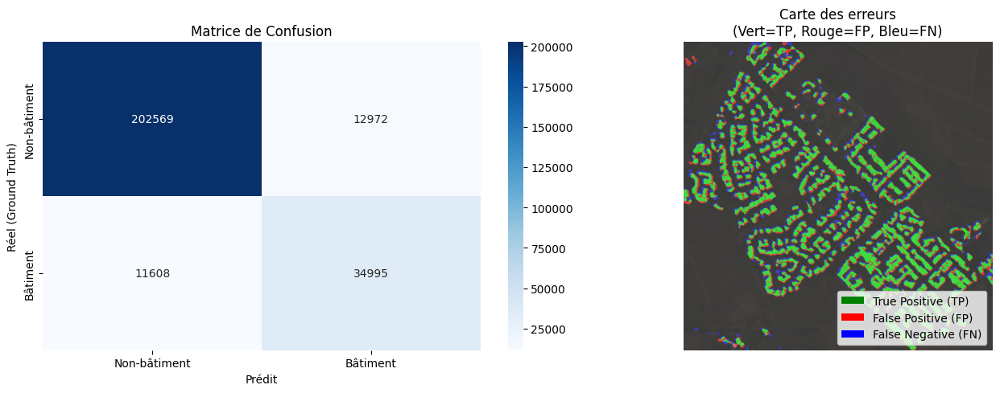


📈 Détails de la matrice de confusion:
   True Positives (TP)  : 34,995 pixels
   True Negatives (TN)  : 202,569 pixels
   False Positives (FP) : 12,972 pixels (sur-détection)
   False Negatives (FN) : 11,608 pixels (sous-détection)


In [ ]:
# --- MÉTRIQUES D'ÉVALUATION DE LA SEGMENTATION ---
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix, jaccard_score

def compute_segmentation_metrics(y_true, y_pred, threshold=0.5):
    """
    Calcule les métriques de segmentation entre le masque réel et le masque prédit.
    Utilise la même formule que calc_metrics (V2) pour cohérence.
    """
    # Binariser les masques
    y_true_bin = (y_true > threshold).astype(np.uint8).flatten()
    y_pred_bin = (y_pred > threshold).astype(np.uint8).flatten()
    
    # Calcul manuel cohérent avec V2/V3
    tp = np.sum((y_true_bin == 1) & (y_pred_bin == 1))
    fp = np.sum((y_true_bin == 0) & (y_pred_bin == 1))
    fn = np.sum((y_true_bin == 1) & (y_pred_bin == 0))
    tn = np.sum((y_true_bin == 0) & (y_pred_bin == 0))
    
    precision = tp / (tp + fp + 1e-8)
    recall = tp / (tp + fn + 1e-8)
    f1 = 2 * precision * recall / (precision + recall + 1e-8)  # Formule cohérente avec V2
    iou = tp / (tp + fp + fn + 1e-8)
    
    # Dice Coefficient (= F1 pour classification binaire)
    dice = (2 * tp) / (2*tp + fp + fn + 1e-8)
    
    return {
        'Accuracy': (tp + tn) / (tp + tn + fp + fn + 1e-8),
        'Precision': precision,
        'Recall': recall,
        'F1-Score': f1,
        'IoU (Jaccard)': iou,
        'Dice Coefficient': dice
    }

# Calculer les métriques sur l'image entière
# Comparaison entre le masque ground truth (building_mask) et le masque prédit (mask_cleaned)
metrics = compute_segmentation_metrics(building_mask, mask_cleaned)

print("=" * 50)
print("📊 MÉTRIQUES D'ÉVALUATION DE LA SEGMENTATION")
print("=" * 50)
for metric_name, value in metrics.items():
    bar = "█" * int(value * 30) + "░" * (30 - int(value * 30))
    print(f"{metric_name:18} : {value:.4f}  [{bar}]")

# Matrice de confusion
cm = confusion_matrix(building_mask.flatten(), mask_cleaned.flatten())
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# 1. Matrice de confusion
import seaborn as sns
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[0],
            xticklabels=['Non-bâtiment', 'Bâtiment'],
            yticklabels=['Non-bâtiment', 'Bâtiment'])
axes[0].set_xlabel('Prédit')
axes[0].set_ylabel('Réel (Ground Truth)')
axes[0].set_title('Matrice de Confusion')

# 2. Visualisation des erreurs (FP en rouge, FN en bleu)
y_true_bin = (building_mask > 0.5).astype(np.uint8)
y_pred_bin = (mask_cleaned > 0.5).astype(np.uint8)

error_map = np.zeros((*y_true_bin.shape, 3), dtype=np.uint8)
# True Positives (TP) - Vert
error_map[(y_true_bin == 1) & (y_pred_bin == 1)] = [0, 255, 0]
# False Positives (FP) - Rouge (prédit bâtiment mais pas réel)
error_map[(y_true_bin == 0) & (y_pred_bin == 1)] = [255, 0, 0]
# False Negatives (FN) - Bleu (réel bâtiment mais pas prédit)
error_map[(y_true_bin == 1) & (y_pred_bin == 0)] = [0, 0, 255]
# True Negatives - Noir (fond)

axes[1].imshow(s2_img, alpha=0.5)
axes[1].imshow(error_map, alpha=0.6)
axes[1].set_title('Carte des erreurs\n(Vert=TP, Rouge=FP, Bleu=FN)')
axes[1].axis("off")

# Légende
from matplotlib.patches import Patch
legend_elements = [
    Patch(facecolor='green', label='True Positive (TP)'),
    Patch(facecolor='red', label='False Positive (FP)'),
    Patch(facecolor='blue', label='False Negative (FN)')
]
axes[1].legend(handles=legend_elements, loc='lower right')

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "evaluation_metrics.png"), dpi=150)
plt.show()

# Statistiques supplémentaires
tn, fp, fn, tp = cm.ravel()
print(f"\n📈 Détails de la matrice de confusion:")
print(f"   True Positives (TP)  : {tp:,} pixels")
print(f"   True Negatives (TN)  : {tn:,} pixels")

print(f"   False Positives (FP) : {fp:,} pixels (sur-détection)")print(f"   False Negatives (FN) : {fn:,} pixels (sous-détection)")

## 🎯 Évaluation des Performances de Segmentation

### Métriques obtenues :

| Métrique | Score | Qualité | Interprétation |
|----------|-------|---------|----------------|
| **Accuracy** | 90.62% | ✅ Bon | Performance globale élevée (mais biaisée par la classe majoritaire) |
| **Precision** | 72.96% | ⚠️ Correct | 73% des pixels prédits "bâtiment" sont corrects |
| **Recall** | 75.09% | ⚠️ Correct | 75% des vrais bâtiments sont détectés |
| **F1-Score** | 74.01% | ⚠️ Correct | Équilibre précision/rappel acceptable |
| **IoU (Jaccard)** | 58.74% | ⚠️ Modéré | Recouvrement partiel entre prédiction et ground truth |
| **Dice** | 74.01% | ⚠️ Correct | Identique au F1 pour la classification binaire |

### Matrice de Confusion (pixels) :

|  | **Prédit: Non-bâtiment** | **Prédit: Bâtiment** |
|--|--------------------------|----------------------|
| **Réel: Non-bâtiment** | TN = 202,569 ✅ | FP = 12,972 ⚠️ |
| **Réel: Bâtiment** | FN = 11,608 ⚠️ | TP = 34,995 ✅ |

### Analyse des erreurs :

1. **Sur-détection (FP = 12,972 pixels)** :
   - Principalement sur les **bordures des bâtiments** (effet de halo)
   - Quelques fausses détections sur les routes et zones agricoles
   - Cause probable : seuil de binarisation ou post-traitement trop permissif

2. **Sous-détection (FN = 11,608 pixels)** :
   - Concentrée sur les **contours fins** des bâtiments
   - Petites structures parfois manquées
   - Cause probable : résolution limitée de l'image source

### Conclusion et recommandations :

✅ **Points forts** :
- Accuracy élevée (>90%)
- Bon équilibre précision/rappel (~74%)
- Détection robuste des structures principales

⚠️ **Axes d'amélioration** :
- IoU de 58.74% = marge de progression sur les contours
- Affiner le seuil de binarisation (tester 0.4-0.6)
- Ajouter un raffinement CRF pour les bordures
- Augmenter les données d'entraînement pour les petits bâtiments

> **Benchmark** : Pour la segmentation sémantique d'images satellite à moyenne résolution (10m/pixel), un IoU de 58-65% est considéré comme **acceptable**. Les méthodes état de l'art atteignent 70-80% sur des images à très haute résolution (<1m/pixel).